In [1]:
setwd('~/Downloads/proj/')

library(data.table)
library(edgeR)
library(EDASeq)
library(RUVSeq)
library(affycoretools)
library(ggplot2)
library(DESeq2)
library(pheatmap)
require(dplyr)
require(stringr)

# project directories, and libraries loaded and saving total number of patients

MM_cell_line = data.frame(fread("HMCL66_HTSeq_GENE_Counts_v2.txt"))
MM_patients = data.frame(fread("MMRF_CoMMpass_IA13a_E74GTF_HtSeq_Gene_Counts.txt"))

num_pat_tot = length(MM_patients[2,])
num_cell_line_tot = length(MM_cell_line[2,])

# checking total number of patients and cell lines and output head

head(MM_cell_line)
head(MM_patients)
print(num_pat_tot)
print(num_cell_line_tot)

Loading required package: limma
Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following object is masked from ‘package:limma’:

    plotMA

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colMeans,
    colnames, colSums, dirname, do.call, duplicated, eval, evalq,
    Filter, Find, get, grep, grepl, intersect, is.unsorted, lapply,
    lengths, Map, mapply, match, mget, order, paste, pmax, pmax.int,
    pmin, pmin.int, Position, rank, rbind, Reduce, rowMeans, rownames,
    rowSums, sapply, setdiff, sort, tab

Sample,GENE_NAME,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,TSPAN6,2,0,100,2,0,0,2,88,⋯,2,0,0,0,0,0,0,0,2,114
ENSG00000000005,TNMD,1,0,0,0,1,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
ENSG00000000419,DPM1,3949,4134,4795,8278,2262,2587,3607,2450,⋯,2694,1247,3263,3044,3108,4538,7336,4430,9279,13828
ENSG00000000457,SCYL3,1597,1513,2412,1988,1530,926,1415,573,⋯,665,994,497,1611,1603,1375,1426,893,1540,1660
ENSG00000000460,C1orf112,3072,1488,2193,4091,3208,1170,3614,1618,⋯,1472,1517,1346,2068,3128,1850,2522,2320,793,689
ENSG00000000938,FGR,0,22,701,5,2,4,89,4,⋯,0,125,777,50,1890,2315,1514,5,3776,847


GENE_ID,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,17,999,85,9,801,20,12,16,4,⋯,2,186,102,347,128,17,11,3,18,6
ENSG00000000005,1,0,0,2,3,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
ENSG00000000419,1495,3271,2303,1234,1896,4400,2013,1745,1698,⋯,2459,1269,337,3347,1049,2545,1625,1253,1905,683
ENSG00000000457,231,809,203,1208,425,2793,710,922,853,⋯,734,771,327,392,90,406,857,548,808,393
ENSG00000000460,87,319,31,183,85,929,174,292,837,⋯,267,104,114,126,17,67,196,141,199,55
ENSG00000000938,318,105,119,190,2064,2952,12,351,498,⋯,46,14,303,2007,58,77,1037,11,174,22


[1] 893
[1] 68


In [2]:
# finding genes in common and creating character vector of Ensembl Gene IDs

ensembl_intersect = intersect(MM_cell_line$Sample, MM_patients$GENE_ID)

# assigning rownames as ensembl gene IDs so as to be able to parse by ensembl Gene IDs

rownames(MM_cell_line) = MM_cell_line$Sample
rownames(MM_patients) = MM_patients$GENE_ID

# removing gene ID and gene name columns 
# and saving them in a separate place 
# note only those available in MM_cell_line
# also filtering out genes in common
# and fusing them into a single dataframe
# and filtering for only newly diagnosed patients

ensembl_ids = MM_cell_line[,1]
MM_cell_line = MM_cell_line[, -1]
gene_names = MM_cell_line[,1]
gene_info = cbind(ensembl_ids, gene_names)

MM_cell_line = MM_cell_line[,-1]
MM_cell_line = MM_cell_line[ensembl_intersect, ]
MM_patients = MM_patients[ensembl_intersect, -1]

MM_patient_ids = data.frame(colnames(MM_patients))
MM_patients_new = filter(MM_patient_ids, str_extract(MM_patient_ids[,1], "_[0-9]_") == "_1_")
keepc = colnames(MM_patients) %in% MM_patients_new[,1]
MM_patients = MM_patients[,keepc]

MM_combined = cbind(MM_cell_line, MM_patients)

# checking output head to confirm removal

head(MM_cell_line)
head(MM_patients)
head(MM_combined)
head(gene_info)

# saving number of newly diagnosed patients and printing out percentage

num_new_pat = length(MM_patients[2,])
print(num_new_pat)
print((num_new_pat/num_pat_tot)*100)

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,2,0,0,0,0,0,0,0,2,114
ENSG00000000005,1,0,0,0,1,0,0,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,2694,1247,3263,3044,3108,4538,7336,4430,9279,13828
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,665,994,497,1611,1603,1375,1426,893,1540,1660
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,1472,1517,1346,2068,3128,1850,2522,2320,793,689
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,0,125,777,50,1890,2315,1514,5,3776,847


,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2341_1_BM,MMRF_2501_1_BM,MMRF_1383_1_BM,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,17,999,85,9,801,12,16,43,594,693,⋯,1,49,2,186,102,128,17,3,18,6
ENSG00000000005,1,0,0,2,3,0,0,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000000419,1495,3271,2303,1234,1896,2013,1745,2403,1847,973,⋯,1751,2537,2459,1269,337,1049,2545,1253,1905,683
ENSG00000000457,231,809,203,1208,425,710,922,1203,1160,587,⋯,493,220,734,771,327,90,406,548,808,393
ENSG00000000460,87,319,31,183,85,174,292,478,218,107,⋯,104,50,267,104,114,17,67,141,199,55
ENSG00000000938,318,105,119,190,2064,12,351,555,37,21,⋯,3064,46,46,14,303,58,77,11,174,22


,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,1,49,2,186,102,128,17,3,18,6
ENSG00000000005,1,0,0,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,1751,2537,2459,1269,337,1049,2545,1253,1905,683
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,493,220,734,771,327,90,406,548,808,393
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,104,50,267,104,114,17,67,141,199,55
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,3064,46,46,14,303,58,77,11,174,22


ensembl_ids,gene_names
ENSG00000000003,TSPAN6
ENSG00000000005,TNMD
ENSG00000000419,DPM1
ENSG00000000457,SCYL3
ENSG00000000460,C1orf112
ENSG00000000938,FGR


[1] 779
[1] 87.23404


In [3]:
# transforming counts of cell_line, patients, and combined 
# to account for sequencing depth
# and creating boolean vector of those genes that
# holds TRUE for genes that account for greater than a millionth
# of total mapped reads in 2 or more samples
# then filtering MM_combined based on this vector
# aka filtering out low count genes


MM_combined_cpm = cpm(MM_combined)
keep = rowSums(MM_combined_cpm > 1) > 2
MM_combined.filtered = MM_combined[keep, ]
MM_patients = MM_patients[keep, ]
MM_cell_line = MM_cell_line[keep, ]

# checking output head

head(keep)
head(MM_combined.filtered)

ENSG00000000003 ENSG00000000005 ENSG00000000419 ENSG00000000457 ENSG00000000460 
           TRUE           FALSE            TRUE            TRUE            TRUE 
ENSG00000000938 
           TRUE

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,1,49,2,186,102,128,17,3,18,6
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,1751,2537,2459,1269,337,1049,2545,1253,1905,683
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,493,220,734,771,327,90,406,548,808,393
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,104,50,267,104,114,17,67,141,199,55
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,3064,46,46,14,303,58,77,11,174,22
ENSG00000000971,11,207,24,21,18,8,685,12,28,2,⋯,2566,27,13,5,28,30,18,1680,56,10


In [4]:
# normalizing combined data frame with vst

norm_combined = vst(as.matrix(MM_combined.filtered))

# checking output head

head(norm_combined)

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,5.121115,4.830701,6.753159,5.087762,4.830701,4.830701,5.122115,6.930293,5.303622,4.830701,⋯,5.131689,6.907446,5.196712,7.948939,7.400009,8.320791,6.082664,5.345835,5.900425,5.872658
ENSG00000000419,11.192958,11.058860,11.481792,11.894072,10.306507,10.979705,11.075250,11.003090,10.138017,11.723434,⋯,11.124923,11.843401,11.180281,10.426509,8.784326,11.123679,11.761265,10.632905,10.805345,10.830429
ENSG00000000457,9.936576,9.672406,10.518177,9.901600,9.772317,9.566903,9.781765,9.028327,9.709607,10.338227,⋯,9.384906,8.525344,9.514931,9.744664,8.746203,7.907656,9.229529,9.503027,9.627453,10.065296
ENSG00000000460,10.840491,9.650001,10.386322,10.898915,10.791701,9.882322,11.077974,10.424602,10.251060,10.602664,⋯,7.505744,6.925478,8.229035,7.322156,7.515750,6.363182,7.140238,7.818035,7.873429,7.606155
ENSG00000000938,4.830701,5.715836,8.861104,5.236351,5.110011,5.299783,6.654161,5.316598,5.165852,11.191736,⋯,11.916476,6.851781,6.496629,5.841891,8.650335,7.430139,7.276126,5.803804,7.723670,6.729497
ENSG00000000971,5.506729,7.282633,5.824017,5.653577,5.658535,5.491225,8.827028,5.664625,6.050852,5.213020,⋯,11.664665,6.426298,5.750688,5.442846,6.297891,6.805684,6.116758,11.042982,6.640096,6.157982


In [5]:
# separating out patient and cell line columns from norm_combined 

norm_pat = norm_combined[,colnames(MM_patients)]#pat_bool]
norm_cell = norm_combined[,colnames(MM_cell_line)]

# checking output head

head(norm_pat)
head(norm_cell)

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2341_1_BM,MMRF_2501_1_BM,MMRF_1383_1_BM,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,6.060798,9.545865,7.504912,5.678664,9.831334,5.882917,5.839145,6.162487,9.012450,10.080853,⋯,5.131689,6.907446,5.196712,7.948939,7.400009,8.320791,6.082664,5.345835,5.900425,5.872658
ENSG00000000419,10.957643,11.180638,11.796341,10.495380,11.022594,11.404325,10.675590,10.560857,10.541196,10.548945,⋯,11.124923,11.843401,11.180281,10.426509,8.784326,11.123679,11.761265,10.632905,10.805345,10.830429
ENSG00000000457,8.464263,9.266066,8.504619,10.465857,8.991437,9.954385,9.798282,9.614478,9.901645,9.854608,⋯,9.384906,8.525344,9.514931,9.744664,8.746203,7.907656,9.229529,9.503027,9.627453,10.065296
ENSG00000000460,7.361361,8.102342,6.578214,8.019636,7.149116,8.146953,8.315703,8.425506,7.797638,7.725440,⋯,7.505744,6.925478,8.229035,7.322156,7.515750,6.363182,7.140238,7.818035,7.873429,7.606155
ENSG00000000938,8.864747,6.942817,7.872284,8.063233,11.141904,5.882917,8.540640,8.609911,6.225164,6.277881,⋯,11.916476,6.851781,6.496629,5.841891,8.650335,7.430139,7.276126,5.803804,7.723670,6.729497
ENSG00000000971,8.976686,9.666459,9.285435,7.717287,8.495919,6.037327,8.073008,6.039664,6.582150,6.067497,⋯,11.664665,6.426298,5.750688,5.442846,6.297891,6.805684,6.116758,11.042982,6.640096,6.157982


,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
ENSG00000000003,5.121115,4.830701,6.753159,5.087762,4.830701,4.830701,5.122115,6.930293,5.303622,4.830701,⋯,5.183315,4.830701,4.830701,4.830701,4.830701,4.830701,4.830701,4.830701,5.118442,6.661173
ENSG00000000419,11.192958,11.058860,11.481792,11.894072,10.306507,10.979705,11.075250,11.003090,10.138017,11.723434,⋯,11.203237,10.090880,11.337907,10.916534,10.580120,11.126976,11.934854,11.032084,12.378849,12.643881
ENSG00000000457,9.936576,9.672406,10.518177,9.901600,9.772317,9.566903,9.781765,9.028327,9.709607,10.338227,⋯,9.284631,9.782236,8.783722,10.035066,9.673136,9.484374,9.654509,8.863879,9.861965,9.674925
ENSG00000000460,10.840491,9.650001,10.386322,10.898915,10.791701,9.882322,11.077974,10.424602,10.251060,10.602664,⋯,10.359418,10.360492,10.104075,10.378362,10.589037,9.883744,10.433379,10.133464,8.981951,8.534477
ENSG00000000938,4.830701,5.715836,8.861104,5.236351,5.110011,5.299783,6.654161,5.316598,5.165852,11.191736,⋯,4.830701,7.279769,9.363245,6.271504,9.895878,10.190136,9.735164,5.239458,11.103832,8.793222
ENSG00000000971,5.506729,7.282633,5.824017,5.653577,5.658535,5.491225,8.827028,5.664625,6.050852,5.213020,⋯,7.226316,5.705353,6.555933,5.130448,7.075538,5.971329,6.803862,8.441138,7.936526,7.174217


In [6]:
g2k = rownames(MM_combined.filtered)
CCLE_cell_line = data.frame(fread("CCLE_RNAseq_genes_counts_20180929.gct"))
gid = CCLE_cell_line$Name
gid2 = substr(gid, 1, 15)
rownames(CCLE_cell_line) = gid2

CCLE_cell_line = CCLE_cell_line[-1]
CCLE_cell_line = CCLE_cell_line[-1]

CCLE_cell_line_meta = data.frame(fread("Cell_lines_annotations_20181226.txt"))
CCLE_cell_line_meta_2 = CCLE_cell_line_meta[(CCLE_cell_line_meta$type == 'multiple_myeloma'),]

CCLE_bool2 = colnames(CCLE_cell_line) %in% CCLE_cell_line_meta_2$CCLE_ID
CCLE_cell_line = CCLE_cell_line[,CCLE_bool2]
CCLE_cell_line = CCLE_cell_line[g2k,]
length(CCLE_cell_line[,1])
head(CCLE_cell_line)

[1] 22459

,AMO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,EJM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,JJN3_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KARPAS620_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KHM1B_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS11_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS12BM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,⋯,L363_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,LP1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MM1S_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP8_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NCIH929_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,OPM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,RPMI8226_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,SKMM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,U266B1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,56,642,15,17,204,13,4,7,14,24,⋯,16,30,22,26,27,26,14,29,16,31
ENSG00000000419,10884,7383,7458,5989,5646,9925,4271,5864,5662,7070,⋯,12073,9589,10297,7354,7369,42842,20907,5507,7197,3544
ENSG00000000457,2572,1482,2286,2691,1948,1876,2182,2068,2849,2044,⋯,4243,5365,3481,2653,3947,5933,3214,1439,1739,1797
ENSG00000000460,3844,2741,5379,3464,2487,2782,2757,2402,5753,4794,⋯,6044,1237,6129,1202,2375,4064,2694,2784,2183,2438
ENSG00000000938,3761,4,17,18,4547,13572,11348,42,2,9,⋯,62,5,20,397,29998,5497,3775,10,1288,369
ENSG00000000971,51,54,18,1617,36,62,11,155,27,12,⋯,18,47,44,31,1328,29,336,440,1044,41


In [7]:
CCLE_cell_names = c('AMO1_DSMZ_p8', 'EJM_DSMZ_p9', 'HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
                   'JJN3_DSMZ_p8', 'Karpas620_DSMZ_p14', 'KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE',
                   'KHM1B_JCRB_p12', 'KMM1_JCRB_p13', 'KMS11_JCRB_Sus_p12', 'KMS12BM_JCRB_p9',
                   'KMS18_p12', 'KMS20_JCRB_p18', 'KMS21BM_JCRB_p10', 'KMS26_JCRB_p9', 'KMS27_JCRB_p8',
                   'KMS28BM_JCRB_p9', 'KMS34_JCRB_p10', 'L363_DSMZ_p8', 'LP1_DSMZ_p9', 'MM1S_ATCC_p7',
                   'MOLP2_DSMZ_p18', 'MOLP8_DSMZ_p9', 'NCIH929_DSMZ_p8', 'OPM2_DSMZ_p9',
                   'RPMI8226_ATCC_p7', 'SKMM2_DSMZ_p17', 'U266_ATCC_p8')
colnames(CCLE_cell_line) = CCLE_cell_names

MM_combined_ccle.filtered = cbind(CCLE_cell_line, MM_patients)

In [8]:
# utilizing IQR to get vector of top 5000 and top 10000 genes

keepi = apply(norm_pat, 1, IQR)
keepis = sort(keepi, decreasing = TRUE)
keepi5000 = keepi %in% keepis[1:5000]
keepi10000 = keepi %in% keepis[1:10000]

In [9]:
# making function for doing correlation analysis and generating violin plots

makeplots = function(corset, pnames, clnames, titl) {
    
    MM.cor.v = cor(corset, method = "s")

    #clnames = colnames(MM_cell_line)
    tumor_cell_all = data.frame()

    for(patients in pnames){
        cell_line_tumor_cor = MM.cor.v[patients, clnames]
        cell_line_tumor_cor = data.frame(patient = patients, 
                                         sample = names(cell_line_tumor_cor), cor = cell_line_tumor_cor)
        tumor_cell_all = rbind(tumor_cell_all, cell_line_tumor_cor)
    }

    cell_line_order <- aggregate(cor ~ sample, tumor_cell_all, median)
    cell_line_ordered <- cell_line_order$sample[order(cell_line_order$cor, decreasing=T)]
    tumor_cell_all$sample = factor(tumor_cell_all$sample, levels = cell_line_ordered)

      p <- ggplot(tumor_cell_all, aes(sample, cor))
      print(p + geom_violin()  +  ylab("correlation") + geom_boxplot(width=0.2) + 
              xlab("") + labs(title = titl) +
              stat_summary(geom = "crossbar", width=0.2, fatten=2, color="red", 
                           fun.data = function(x){ return(c(y=median(x), ymin=median(x), ymax=median(x))) }) +  
            theme(panel.background = element_rect(color = 'white'), 
                  axis.text.x = element_text(angle = 70, hjust = 1, size=8)) 
      )
   # return(cell_line_order)
}

In [10]:
MM_combined_ccle.filtered[is.na(MM_combined_ccle.filtered)] <- 0

norm_CCLE_combined = vst(as.matrix(MM_combined_ccle.filtered))
norm_CCLE_combined_5000 = norm_CCLE_combined[keepi5000, ]

converting counts to integer mode


In [11]:
head(norm_CCLE_combined_5000)
length(norm_CCLE_combined_5000[,1])

,AMO1_DSMZ_p8,EJM_DSMZ_p9,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,JJN3_DSMZ_p8,Karpas620_DSMZ_p14,KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KHM1B_JCRB_p12,KMM1_JCRB_p13,KMS11_JCRB_Sus_p12,KMS12BM_JCRB_p9,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,5.946646,8.079634,5.358497,5.437304,6.953357,5.353658,5.152655,5.201705,5.436753,5.537846,⋯,5.075201,6.882931,5.142295,7.938168,7.372667,8.313711,6.045455,5.296532,5.859055,5.831014
ENSG00000000460,10.422312,9.947979,10.740284,10.308744,9.926322,10.002771,10.443440,9.817893,11.287263,10.678293,⋯,7.482072,6.901195,8.216229,7.305299,7.489337,6.333283,7.118412,7.811328,7.856755,7.587742
ENSG00000000938,10.392060,5.090649,5.396013,5.456333,10.760539,12.227951,12.441832,5.810502,5.023150,5.243171,⋯,11.906053,6.826537,6.465757,5.801777,8.630504,7.415296,7.255826,5.765120,7.705804,6.701337
ENSG00000000971,5.895461,5.922967,5.413905,9.276627,5.757235,6.015717,5.402178,6.672613,5.689060,5.315757,⋯,11.654099,6.394901,5.707171,5.394451,6.258786,6.782869,6.080141,11.050038,6.610367,6.121247
ENSG00000001036,10.918490,10.958223,8.780135,10.746479,9.366216,9.543296,5.657647,9.550230,9.897667,7.407672,⋯,11.356121,11.387778,12.237373,9.969866,9.398688,11.433680,12.626629,10.813165,9.417393,10.861331
ENSG00000001561,10.334956,9.147318,9.324061,7.983967,10.784325,10.113018,8.210489,11.134043,10.653577,7.903833,⋯,9.313293,9.280055,12.181953,9.799720,7.680553,8.852686,10.519304,10.751706,10.364442,10.892959


[1] 5000

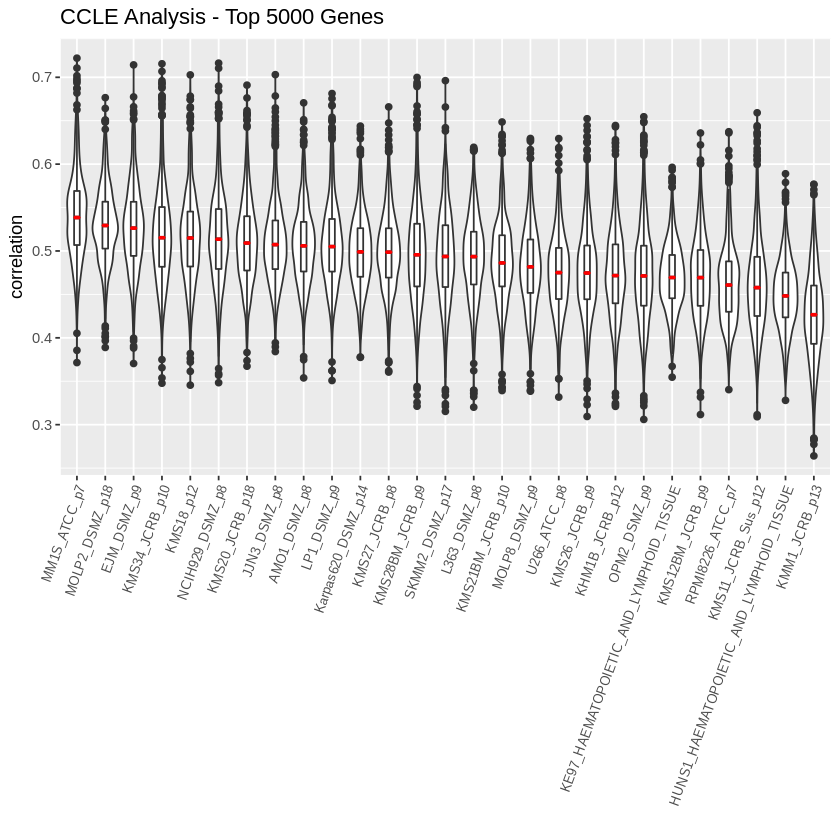

In [12]:
MM.cor.ccle = cor(norm_CCLE_combined_5000, method = "s")
makeplots(norm_CCLE_combined_5000, colnames(MM_patients), colnames(CCLE_cell_line), 'CCLE Analysis - Top 5000 Genes')

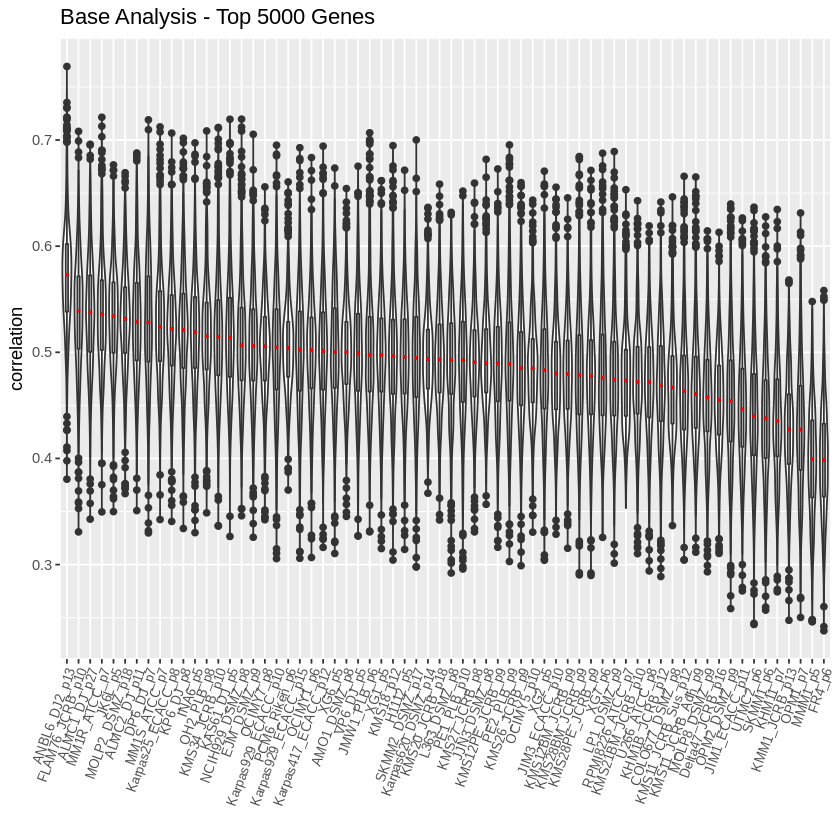

In [13]:
# subsetting top 5000 / 10000 genes

norm_combined_5000 = norm_combined[keepi5000, ]
#norm_combined_10000 = norm_combined[keepi10000, ]

# plots for main analysis using top 5000 / 10000 genes
MM.cor.keats = cor(norm_combined_5000, method = "s")
makeplots(norm_combined_5000, colnames(MM_patients), colnames(MM_cell_line), 'Base Analysis - Top 5000 Genes')

In [14]:
#### DATA FOR TRANSLOCATIONS ####

MM_patients_trans = data.frame(fread("IA13a.structural.variants.annot.translocations.clean.maxHom0.8.minMap0.2.clonality.readRange10000bp.cnvRange2000bp.common.txt"))
MM_patient_trans_ids = MM_patients_trans[,'sample']

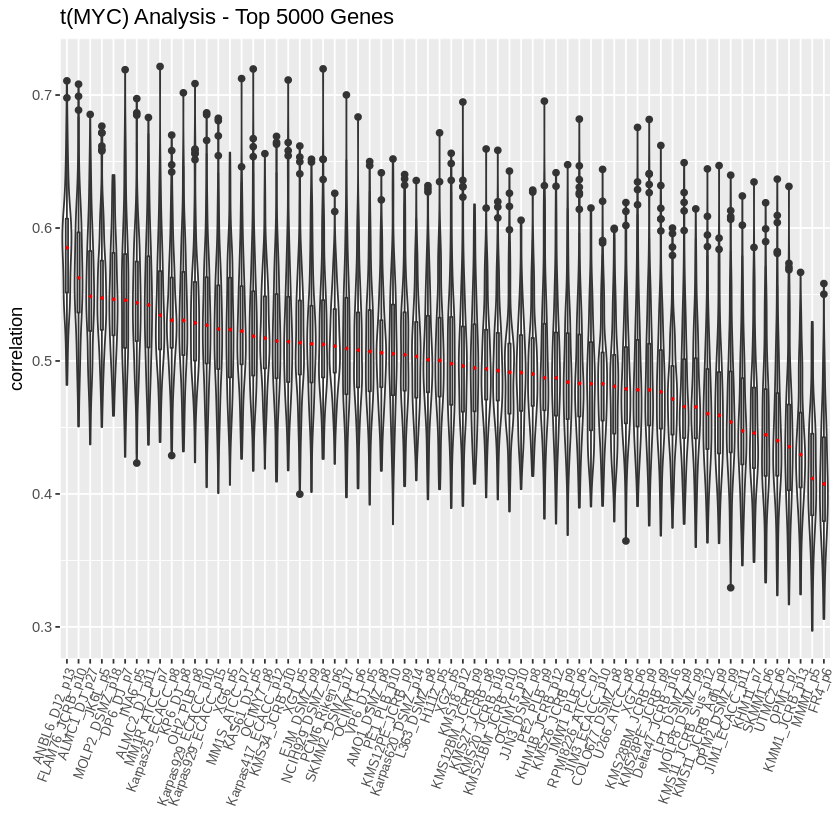

In [15]:
# extracting patients with MYC translocation who are also newly diagnosed

keepMYC = as.logical(MM_patients_trans[,'t.MYC.'])
MM_patients_trans_MYC = MM_patient_trans_ids[keepMYC]
MM_patients_trans_MYC = unique(MM_patients_trans_MYC)
MM_patients_new_trans_MYC = filter(as.data.frame(MM_patients_trans_MYC),
                                   str_extract(as.data.frame(MM_patients_trans_MYC)[,1], "_[0-9]_") == "_1_")
keepcMYC = colnames(MM_patients) %in% MM_patients_new_trans_MYC[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_MYC = norm_pat[,keepcMYC]
norm_combined_MYC = cbind(norm_cell, norm_pat_MYC)
norm_combined_MYC_5000 = norm_combined_MYC[keepi5000, ]
# norm_combined_MYC_10000 = norm_combined_MYC[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_MYC, colnames(norm_pat_MYC), 't(MYC) Analysis - All Genes')
makeplots(norm_combined_MYC_5000, colnames(norm_pat_MYC), colnames(MM_cell_line), 't(MYC) Analysis - Top 5000 Genes')
# makeplots(norm_combined_MYC_10000, colnames(norm_pat_MYC), 't(MYC) Analysis - Top 10000 Genes')

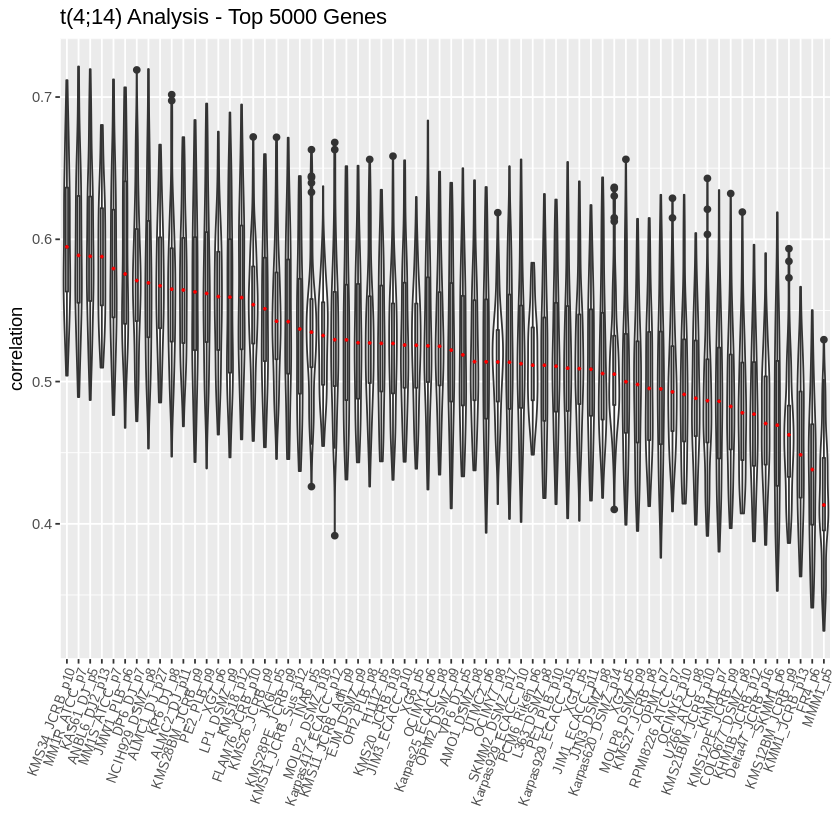

In [16]:
# extracting patients with 4;14 translocation who are also newly diagnosed

keep414 = as.logical(MM_patients_trans[,'t.4.14.'])
MM_patients_trans_414 = MM_patient_trans_ids[keep414]
MM_patients_trans_414 = unique(MM_patients_trans_414)
MM_patients_new_trans_414 = filter(as.data.frame(MM_patients_trans_414),
                                   str_extract(as.data.frame(MM_patients_trans_414)[,1], "_[0-9]_") == "_1_")
keepc414 = colnames(MM_patients) %in% MM_patients_new_trans_414[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_414 = norm_pat[,keepc414]
norm_combined_414 = cbind(norm_cell, norm_pat_414)
norm_combined_414_5000 = norm_combined_414[keepi5000, ]
# norm_combined_414_10000 = norm_combined_414[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_414, colnames(norm_pat_414), 't(4;14) Analysis - All Genes')
makeplots(norm_combined_414_5000, colnames(norm_pat_414), colnames(MM_cell_line), 't(4;14) Analysis - Top 5000 Genes')
# makeplots(norm_combined_414_10000, colnames(norm_pat_414), 't(4;14) Analysis - Top 10000 Genes')

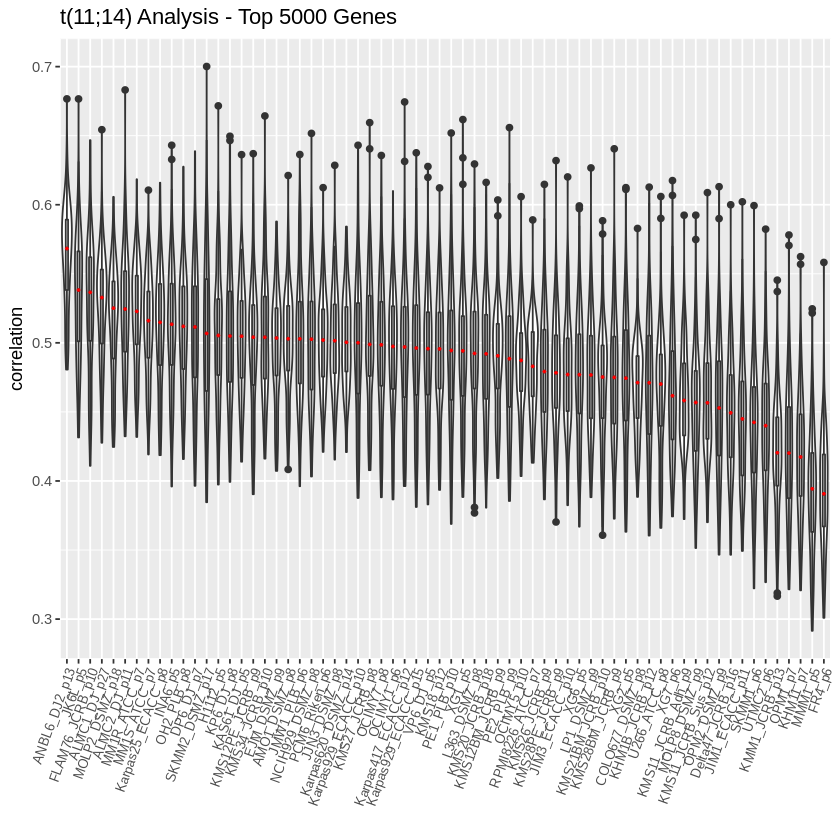

In [17]:
# extracting patients with 11;14 translocation who are also newly diagnosed

keep1114 = as.logical(MM_patients_trans[,'t.11.14.'])
MM_patients_trans_1114 = MM_patient_trans_ids[keep1114]
MM_patients_trans_1114 = unique(MM_patients_trans_1114)
MM_patients_new_trans_1114 = filter(as.data.frame(MM_patients_trans_1114),
                                   str_extract(as.data.frame(MM_patients_trans_1114)[,1], "_[0-9]_") == "_1_")
keepc1114 = colnames(MM_patients) %in% MM_patients_new_trans_1114[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_1114 = norm_pat[,keepc1114]
norm_combined_1114 = cbind(norm_cell, norm_pat_1114)
norm_combined_1114_5000 = norm_combined_1114[keepi5000, ]
# norm_combined_1114_10000 = norm_combined_1114[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_1114, colnames(norm_pat_1114), 't(11;14) Analysis - All Genes')
makeplots(norm_combined_1114_5000, colnames(norm_pat_1114), colnames(MM_cell_line), 't(11;14) Analysis - Top 5000 Genes')
# makeplots(norm_combined_1114_10000, colnames(norm_pat_1114), 't(11;14) Analysis - Top 10000 Genes')

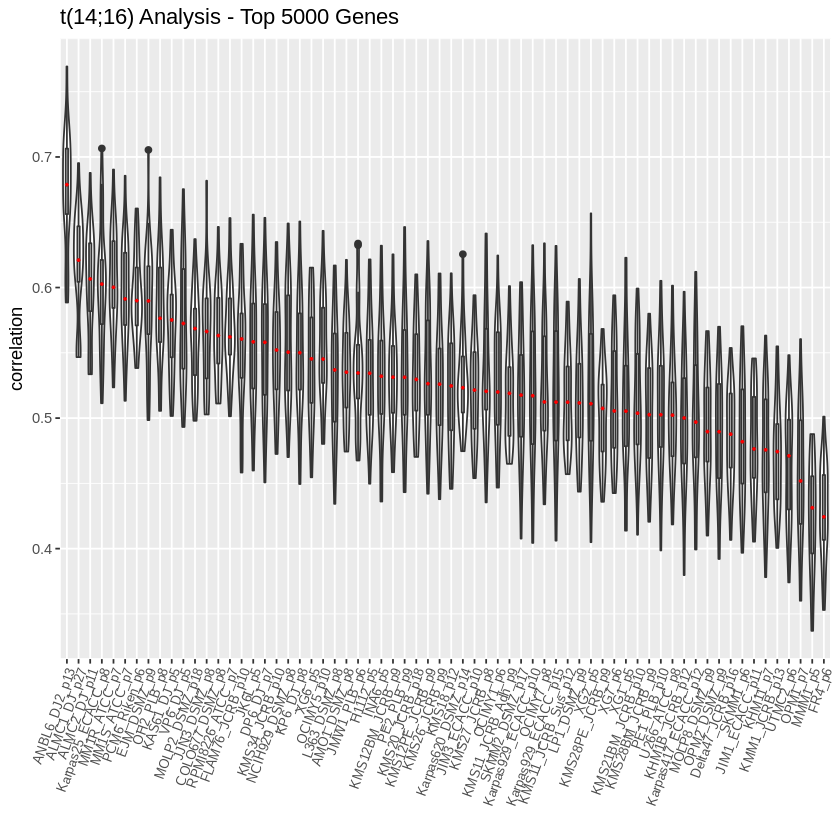

In [18]:
# extracting patients with 14;16 translocation who are also newly diagnosed

keep1416 = as.logical(MM_patients_trans[,'t.14.16.'])
MM_patients_trans_1416 = MM_patient_trans_ids[keep1416]
MM_patients_trans_1416 = unique(MM_patients_trans_1416)
MM_patients_new_trans_1416 = filter(as.data.frame(MM_patients_trans_1416),
                                   str_extract(as.data.frame(MM_patients_trans_1416)[,1], "_[0-9]_") == "_1_")
keepc1416 = colnames(MM_patients) %in% MM_patients_new_trans_1416[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_1416 = norm_pat[,keepc1416]
norm_combined_1416 = cbind(norm_cell, norm_pat_1416)
norm_combined_1416_5000 = norm_combined_1416[keepi5000, ]
# norm_combined_1416_10000 = norm_combined_1416[keepi10000, ]

# # plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_1416, colnames(norm_pat_1416), 't(14;16) Analysis - All Genes')
makeplots(norm_combined_1416_5000, colnames(norm_pat_1416), colnames(MM_cell_line), 't(14;16) Analysis - Top 5000 Genes')
# makeplots(norm_combined_1416_10000, colnames(norm_pat_1416), 't(14;16) Analysis - Top 10000 Genes')

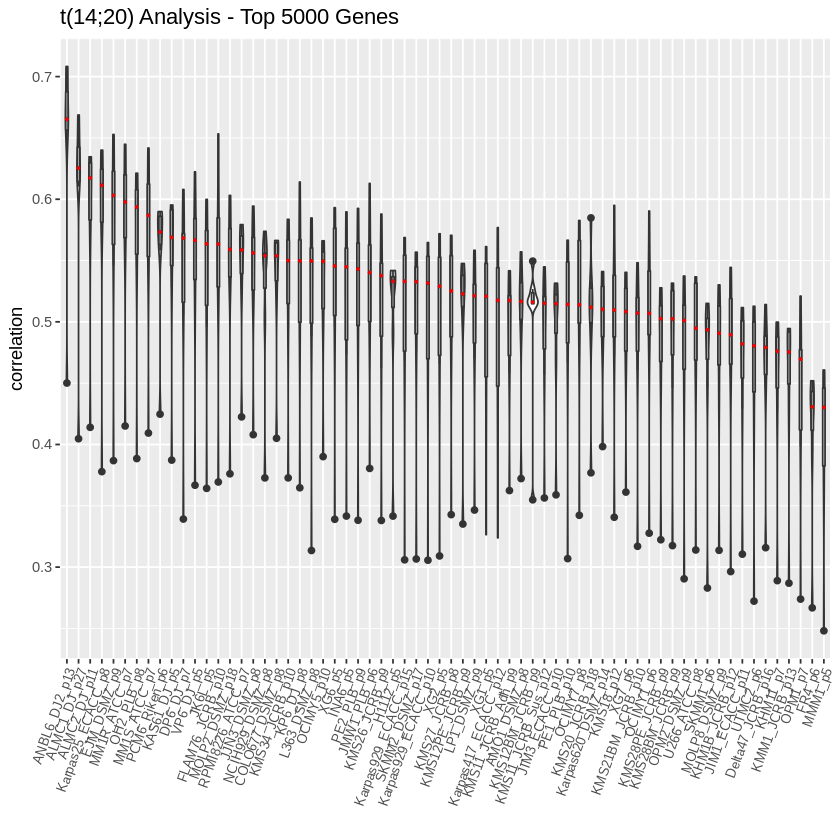

In [19]:
# extracting patients with 14;16 translocation who are also newly diagnosed

keep1420 = as.logical(MM_patients_trans[,'t.14.20.'])
MM_patients_trans_1420 = MM_patient_trans_ids[keep1420]
MM_patients_trans_1420 = unique(MM_patients_trans_1420)
MM_patients_new_trans_1420 = filter(as.data.frame(MM_patients_trans_1420),
                                   str_extract(as.data.frame(MM_patients_trans_1420)[,1], "_[0-9]_") == "_1_")
keepc1420 = colnames(MM_patients) %in% MM_patients_new_trans_1420[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_1420 = norm_pat[,keepc1420]
norm_combined_1420 = cbind(norm_cell, norm_pat_1420)
norm_combined_1420_5000 = norm_combined_1420[keepi5000, ]
# norm_combined_1416_10000 = norm_combined_1416[keepi10000, ]

# # plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_1416, colnames(norm_pat_1416), 't(14;16) Analysis - All Genes')
makeplots(norm_combined_1420_5000, colnames(norm_pat_1420), colnames(MM_cell_line), 't(14;20) Analysis - Top 5000 Genes')
# makeplots(norm_combined_1416_10000, colnames(norm_pat_1416), 't(14;16) Analysis - Top 10000 Genes')

In [20]:
#### Cell line info ####

MM_pat_mut = read.delim("MMRF_CoMMpass_IA13a_IGV_All_Canonical_Variants.mut", stringsAsFactors = F)

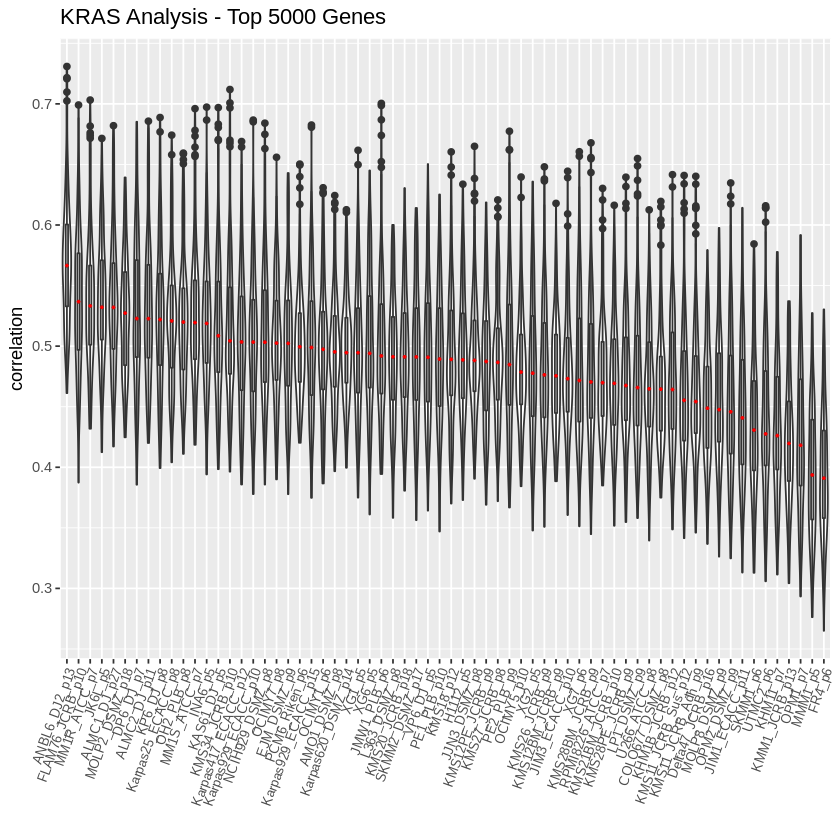

In [21]:
# extracting patients with KRAS mutation who are also newly diagnosed

KRAS_mut = filter(MM_pat_mut, GENE == "KRAS") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(12, 13, 61))

MM_pat_mut_KRAS = unique(KRAS_mut$sample)
keepcKRAS = colnames(MM_patients) %in% MM_pat_mut_KRAS

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_KRAS = norm_pat[,keepcKRAS]
norm_combined_KRAS = cbind(norm_cell, norm_pat_KRAS)
norm_combined_KRAS_5000 = norm_combined_KRAS[keepi5000, ]
# norm_combined_KRAS_10000 = norm_combined_KRAS[keepi10000, ]

# # plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_KRAS, colnames(norm_pat_KRAS), 'KRAS Analysis - All Genes')
makeplots(norm_combined_KRAS_5000, colnames(norm_pat_KRAS), colnames(MM_cell_line), 'KRAS Analysis - Top 5000 Genes')
# makeplots(norm_combined_KRAS_10000, colnames(norm_pat_KRAS), 'KRAS Analysis - Top 10000 Genes')

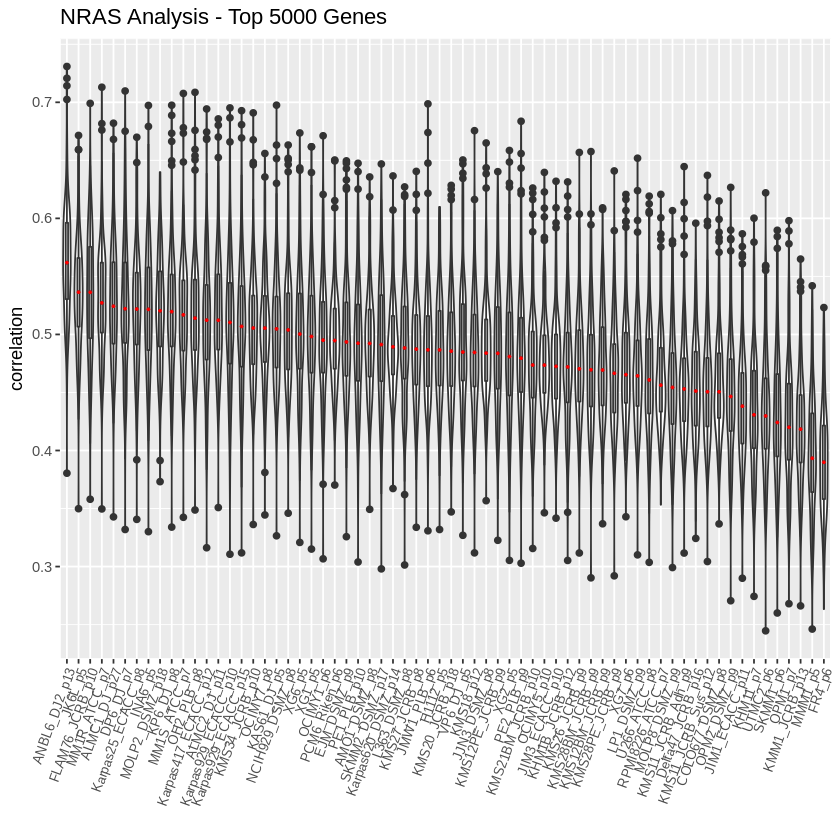

In [22]:
# extracting patients with NRAS mutation who are also newly diagnosed

NRAS_mut = filter(MM_pat_mut, GENE == "NRAS") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(12, 13, 61))

MM_pat_mut_NRAS = unique(NRAS_mut$sample)
keepcNRAS = colnames(MM_patients) %in% MM_pat_mut_NRAS

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_NRAS = norm_pat[,keepcNRAS]
norm_combined_NRAS = cbind(norm_cell, norm_pat_NRAS)
norm_combined_NRAS_5000 = norm_combined_NRAS[keepi5000, ]
# norm_combined_NRAS_10000 = norm_combined_NRAS[keepi10000, ]

# plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_NRAS, colnames(norm_pat_NRAS), 'NRAS Analysis - All Genes')
makeplots(norm_combined_NRAS_5000, colnames(norm_pat_NRAS), colnames(MM_cell_line), 'NRAS Analysis - Top 5000 Genes')
# makeplots(norm_combined_NRAS_10000, colnames(norm_pat_NRAS), 'NRAS Analysis - Top 10000 Genes')

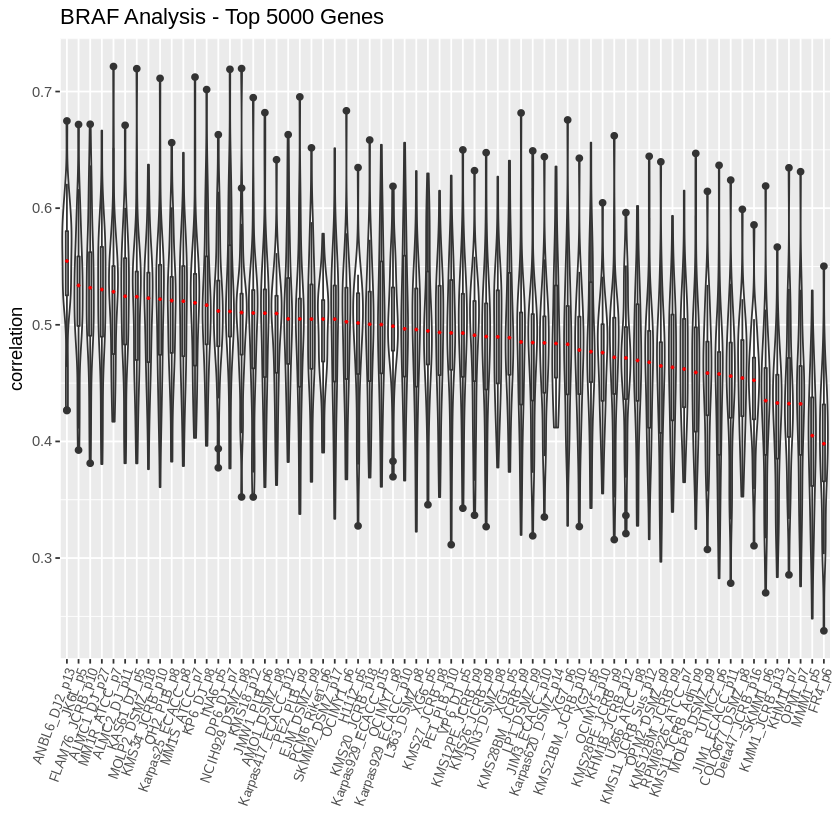

In [23]:
# extracting patients with BRAF mutation who are also newly diagnosed

BRAF_mut = filter(MM_pat_mut, GENE == "BRAF") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(600))

MM_pat_mut_BRAF = unique(BRAF_mut$sample)
keepcBRAF = colnames(MM_patients) %in% MM_pat_mut_BRAF

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_BRAF = norm_pat[,keepcBRAF]
norm_combined_BRAF = cbind(norm_cell, norm_pat_BRAF)
norm_combined_BRAF_5000 = norm_combined_BRAF[keepi5000, ]
# norm_combined_BRAF_10000 = norm_combined_BRAF[keepi10000, ]

# # plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_BRAF, colnames(norm_pat_BRAF), 'BRAF Analysis - All Genes')
makeplots(norm_combined_BRAF_5000, colnames(norm_pat_BRAF), colnames(MM_cell_line), 'BRAF Analysis - Top 5000 Genes')
# makeplots(norm_combined_BRAF_10000, colnames(norm_pat_BRAF), 'BRAF Analysis - Top 10000 Genes')

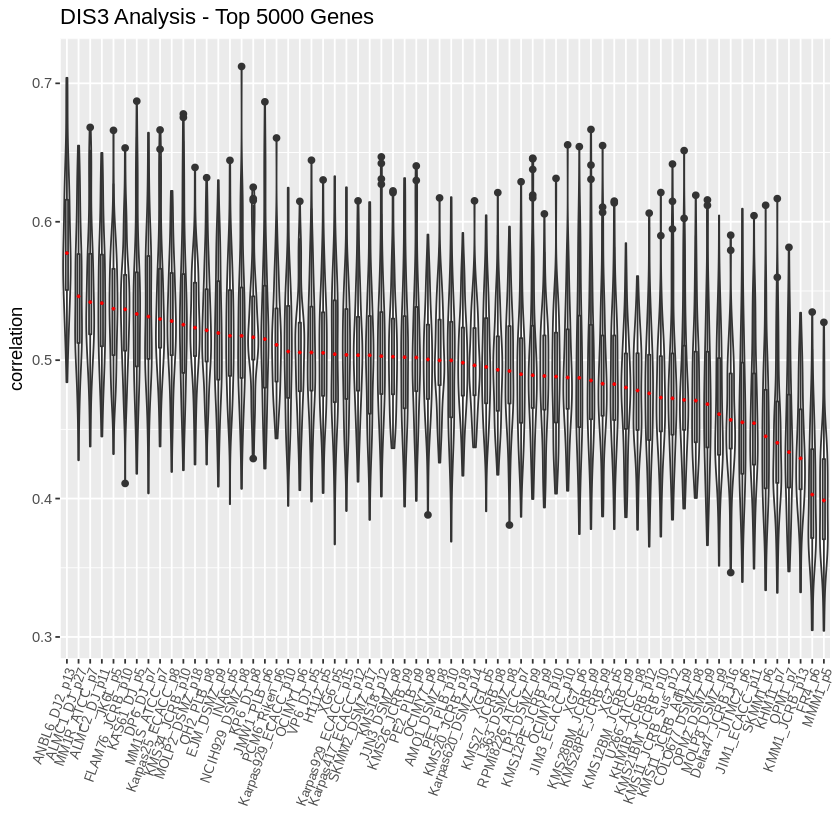

In [24]:
# extracting patients with DIS3 mutation who are also newly diagnosed

DIS3_mut = filter(MM_pat_mut, EFFECT %in% c("missense_variant",
                                         "frameshift_variant",
                                         "stop_gained",
                                         "start_lost",
                                         "stop_lost",
                                         "missense_variant&splice_region_variant",
                                         "frameshift_variant&splice_region_variant",
                                         "disruptive_inframe_deletion",
                                         "stop_gained&splice_region_variant",
                                         "frameshift_variant&stop_gained",
                                         "frameshift_variant&splice_acceptor_variant&splice_region_variant&intron_variant",
                                         "frameshift_variant&splice_donor_variant&splice_region_variant&intron_variant",
                                         "splice_donor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&splice_region_variant",
                                         "disruptive_inframe_insertion",
                                         "stop_gained&disruptive_inframe_deletion",
                                         "frameshift_variant&start_lost",
                                         "stop_gained&disruptive_inframe_insertion",
                                         "disruptive_inframe_deletion&splice_region_variant",
                                         "disruptive_inframe_insertion&splice_region_variant",
                                         "start_lost&splice_region_variant",
                                         "start_lost&inframe_deletion",
                                         "frameshift_variant&stop_lost",
                                         "splice_acceptor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&inframe_deletion")) %>%
  filter(str_extract(sample, "_[0-9]_") == "_1_")  %>%
  filter(GENE == 'DIS3')

MM_pat_mut_DIS3 = unique(DIS3_mut$sample)
keepcDIS3 = colnames(MM_patients) %in% MM_pat_mut_DIS3

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_DIS3 = norm_pat[,keepcDIS3]
norm_combined_DIS3 = cbind(norm_cell, norm_pat_DIS3)
norm_combined_DIS3_5000 = norm_combined_DIS3[keepi5000, ]
# norm_combined_DIS3_10000 = norm_combined_DIS3[keepi10000, ]

# # plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_DIS3, colnames(norm_pat_DIS3), 'DIS3 Analysis - All Genes')
makeplots(norm_combined_DIS3_5000, colnames(norm_pat_DIS3), colnames(MM_cell_line), 'DIS3 Analysis - Top 5000 Genes')
# makeplots(norm_combined_DIS3_10000, colnames(norm_pat_DIS3), 'DIS3 Analysis - Top 10000 Genes')

[1] 88

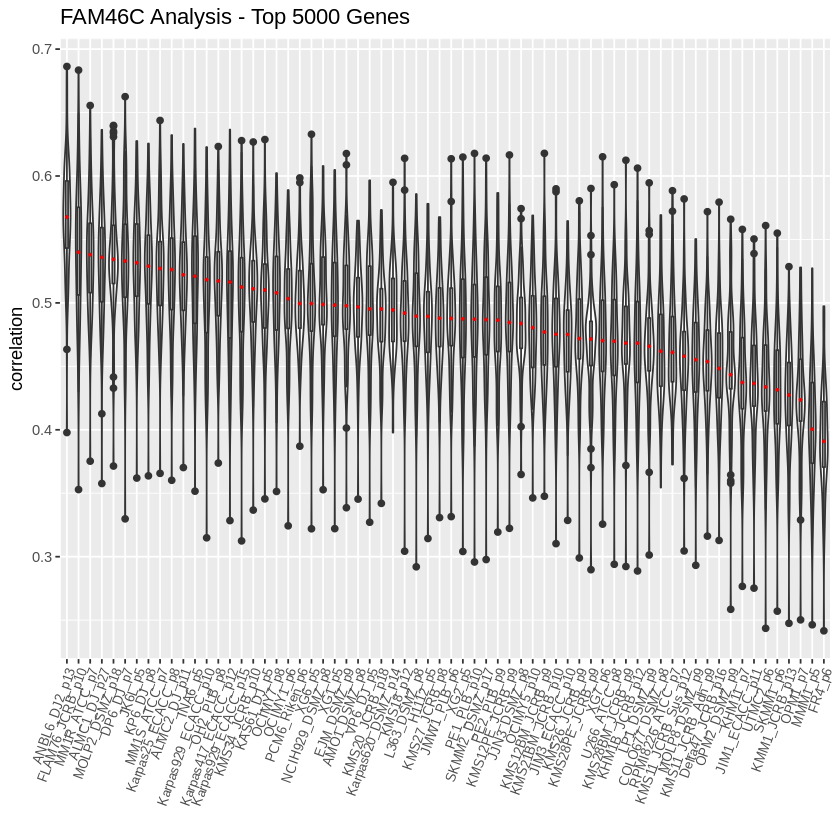

In [25]:
# extracting patients with FAM46C mutation who are also newly diagnosed

FAM46C_mut = filter(MM_pat_mut, EFFECT %in% c("missense_variant",
                                         "frameshift_variant",
                                         "stop_gained",
                                         "start_lost",
                                         "stop_lost",
                                         "missense_variant&splice_region_variant",
                                         "frameshift_variant&splice_region_variant",
                                         "disruptive_inframe_deletion",
                                         "stop_gained&splice_region_variant",
                                         "frameshift_variant&stop_gained",
                                         "frameshift_variant&splice_acceptor_variant&splice_region_variant&intron_variant",
                                         "frameshift_variant&splice_donor_variant&splice_region_variant&intron_variant",
                                         "splice_donor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&splice_region_variant",
                                         "disruptive_inframe_insertion",
                                         "stop_gained&disruptive_inframe_deletion",
                                         "frameshift_variant&start_lost",
                                         "stop_gained&disruptive_inframe_insertion",
                                         "disruptive_inframe_deletion&splice_region_variant",
                                         "disruptive_inframe_insertion&splice_region_variant",
                                         "start_lost&splice_region_variant",
                                         "start_lost&inframe_deletion",
                                         "frameshift_variant&stop_lost",
                                         "splice_acceptor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&inframe_deletion")) %>%
  filter(str_extract(sample, "_[0-9]_") == "_1_")  %>%
  filter(GENE == 'FAM46C')

MM_pat_mut_FAM46C = unique(FAM46C_mut$sample)
length(MM_pat_mut_FAM46C)
keepcFAM46C = colnames(MM_patients) %in% MM_pat_mut_FAM46C

# subsetting norm_pat to those patients with mutation, 
# then keeping genes prior analysed as top 5000, and 10000

norm_pat_FAM46C = norm_pat[,keepcFAM46C]
norm_combined_FAM46C = cbind(norm_cell, norm_pat_FAM46C)
norm_combined_FAM46C_5000 = norm_combined_FAM46C[keepi5000, ]
# norm_combined_FAM46C_10000 = norm_combined_FAM46C[keepi10000, ]

# # plots using all genes, and original 5000 / 10000 genes

# makeplots(norm_combined_FAM46C, colnames(norm_pat_FAM46C), 'FAM46C Analysis - All Genes')
makeplots(norm_combined_FAM46C_5000, colnames(norm_pat_FAM46C), colnames(MM_cell_line), 'FAM46C Analysis - Top 5000 Genes')
# makeplots(norm_combined_FAM46C_10000, colnames(norm_pat_FAM46C), 'FAM46C Analysis - Top 10000 Genes')

In [26]:
cell_names_414 = c('JIM1_ECACC_p11', 'JIM3_ECACC_p10', 'JMW1_PLB_p6', 'KAS61_DJ_p5', 'KHM11_p7', 
                  'KMS11_JCRB_Adh_p9', 'KMS11_JCRB_Sus_p12', 'KMS18_p12', 'KMS26_JCRB_p9',
                  'KMS28BM_JCRB_p9', 'KMS28PE_JCRB_p9', 'KMS34_JCRB_p10', 'LP1_DSMZ_p9',
                  'NCIH929_DSMZ_p8', 'OPM1_p7', 'OPM2_DSMZ_p9', 'PE2_PLB_p9', 'UTMC2_p6',
                  'XG7_p6')

cell_names_1114 = c('FLAM76_JCRB_p10', 'H1112_p5', 'INA6_p5', 'Karpas620_DSMZ_p14', 'KMS12BM_JCRB_p9',
                   'KMS12PE_JCRB_p9', 'KMS21BM_JCRB_p10', 'KMS27_JCRB_p8', 'MMM1_p5', 'MOLP8_DSMZ_p9',
                   'OCIMY7_p8', 'PE1_PLB_p10', 'SKMM2_DSMZ_p17', 'U266_ATCC_p8', 'XG1_p5')

cell_names_1416 = c('ANBL6_DJ2_p13', 'JJN3_DSMZ_p8', 'KMS11_JCRB_Adh_p9', 'KMS11_JCRB_Sus_p12',
                   'MM1R_ATCC_p7', 'MM1S_ATCC_p7', 'OCIMY5_p10', 'PCM6_Riken_p6', 'VP6_DJ_p5')

cell_names_1420 = c('ALMC1_DJ_p27', 'ALMC2_DJ_p11', 'EJM_DSMZ_p9', 'Karpas25_ECACC_p8', 'OH2_PLB_p8', 'SKMM1_p6')

In [27]:
MM.cor.ccle = MM.cor.ccle[colnames(MM_patients),colnames(CCLE_cell_line)]
MM.cor.keats = MM.cor.keats[colnames(MM_patients),colnames(MM_cell_line)]

head(MM.cor.ccle)
head(MM.cor.keats)

,AMO1_DSMZ_p8,EJM_DSMZ_p9,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,JJN3_DSMZ_p8,Karpas620_DSMZ_p14,KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KHM1B_JCRB_p12,KMM1_JCRB_p13,KMS11_JCRB_Sus_p12,KMS12BM_JCRB_p9,⋯,L363_DSMZ_p8,LP1_DSMZ_p9,MM1S_ATCC_p7,MOLP2_DSMZ_p18,MOLP8_DSMZ_p9,NCIH929_DSMZ_p8,OPM2_DSMZ_p9,RPMI8226_ATCC_p7,SKMM2_DSMZ_p17,U266_ATCC_p8
MMRF_2801_1_BM,0.5039581,0.4920968,0.4506607,0.5035400,0.5040112,0.4685971,0.4485621,0.3974373,0.4333748,0.5080662,⋯,0.4798732,0.4506603,0.4975035,0.5253753,0.4586451,0.4727095,0.4339002,0.4921976,0.4664182,0.4633109
MMRF_2718_1_BM,0.4605498,0.4750617,0.4343354,0.4839602,0.4849160,0.4508199,0.4130524,0.3951616,0.4486378,0.4512746,⋯,0.4506717,0.4791804,0.4829110,0.4632297,0.4261210,0.4341703,0.4333351,0.4533886,0.4390122,0.4491175
MMRF_2815_1_BM,0.4748134,0.4684548,0.4217429,0.4916215,0.4740706,0.4552962,0.4127452,0.3847460,0.4857255,0.4143103,⋯,0.4486637,0.5433457,0.5260749,0.4768965,0.4523233,0.4982941,0.4862659,0.4500183,0.4671324,0.4333869
MMRF_1656_1_BM,0.5606936,0.5465071,0.4817067,0.5663151,0.5710594,0.5207093,0.5005300,0.4898367,0.5415043,0.4952852,⋯,0.5407061,0.5614059,0.6177540,0.5671795,0.5429852,0.5957694,0.5369808,0.5030716,0.5313682,0.4986228
MMRF_2461_1_BM,0.4492349,0.4473054,0.4032457,0.4462340,0.4462662,0.4445144,0.4018028,0.3384326,0.3827268,0.4025347,⋯,0.4150288,0.4411939,0.4479695,0.4877246,0.4021942,0.4203391,0.3969750,0.4214464,0.3878265,0.3995958
MMRF_2057_1_BM,0.4959185,0.5499780,0.4093202,0.5124752,0.4901212,0.4311738,0.5041642,0.4653826,0.4843200,0.4582576,⋯,0.5150796,0.5378282,0.5458419,0.5208051,0.5128310,0.5416283,0.5088606,0.4531670,0.5334816,0.4912058


,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
MMRF_2801_1_BM,0.4836378,0.4686470,0.4673668,0.5159783,0.4629237,0.4362713,0.4432058,0.4562471,0.4641367,0.3809849,⋯,0.4822432,0.4170597,0.4518690,0.4246406,0.3811980,0.4448189,0.4333487,0.4284234,0.4318117,0.4243849
MMRF_2718_1_BM,0.4849495,0.4742135,0.4445732,0.4986851,0.4238263,0.3830669,0.4297896,0.4505229,0.4578769,0.3609131,⋯,0.4499876,0.3868856,0.4312632,0.4052534,0.4083806,0.4212332,0.4175788,0.3938507,0.4134381,0.3975064
MMRF_2815_1_BM,0.5091862,0.5064330,0.4771496,0.5271903,0.4292123,0.4188493,0.4921401,0.4548180,0.4632074,0.3782369,⋯,0.4585764,0.4255826,0.4658892,0.4159600,0.4697735,0.4492242,0.4476904,0.4208229,0.4527162,0.5060379
MMRF_1656_1_BM,0.5877339,0.5993928,0.5491432,0.6033711,0.5202250,0.5126301,0.6000781,0.5334721,0.5721010,0.4599265,⋯,0.5209036,0.4941841,0.5514529,0.4984455,0.4998297,0.5496792,0.5424570,0.5512444,0.5797852,0.5676018
MMRF_2461_1_BM,0.4458148,0.4464983,0.4315844,0.4731300,0.4183847,0.3849694,0.4378271,0.4082587,0.4347655,0.3289497,⋯,0.4180156,0.3369164,0.3819786,0.3803042,0.3383132,0.3959002,0.3969621,0.3828487,0.4399801,0.4236413
MMRF_2057_1_BM,0.5746095,0.5751956,0.4935160,0.6114980,0.4710572,0.5040224,0.5667370,0.5380960,0.5972272,0.4307854,⋯,0.4736886,0.4809370,0.5447272,0.5161323,0.4839423,0.5289913,0.5552722,0.5130774,0.5647444,0.5132685


In [28]:
cor_414 = MM.cor.keats[,cell_names_414]
head(cor_414)

cor_414_carrier = cor_414[keepc414,]
head(cor_414_carrier)

cor_414_opat = cor_414[!keepc414,]
head(cor_414_opat)

cor_414_carrier = colMeans(cor_414_carrier)
head(cor_414_carrier)

cor_414_opat = colMeans(cor_414_opat)
head(cor_414_opat)

cor_414_carrier = as.data.frame(cor_414_carrier)
cor_414_carrier$type = 'Patients with Translocation'
cor_414_opat = as.data.frame(cor_414_opat)
cor_414_opat$type = 'Patients without Translocation'

head(cor_414_carrier)
head(cor_414_opat)

colnames(cor_414_carrier) = c('cor', 'type')
colnames(cor_414_opat) = c('cor', 'type')
head(cor_414_carrier)
head(cor_414_opat)

cor_414_bound = rbind(cor_414_carrier, cor_414_opat)
head(cor_414_bound)

,JIM1_ECACC_p11,JIM3_ECACC_p10,JMW1_PLB_p6,KAS61_DJ_p5,KHM11_p7,KMS11_JCRB_Adh_p9,KMS11_JCRB_Sus_p12,KMS18_p12,KMS26_JCRB_p9,KMS28BM_JCRB_p9,KMS28PE_JCRB_p9,KMS34_JCRB_p10,LP1_DSMZ_p9,NCIH929_DSMZ_p8,OPM1_p7,OPM2_DSMZ_p9,PE2_PLB_p9,UTMC2_p6,XG7_p6
MMRF_2801_1_BM,0.4034523,0.4546872,0.4412373,0.4525338,0.3816637,0.4383107,0.4274935,0.4497052,0.4376589,0.4226504,0.4520539,0.4412500,0.4129649,0.4549121,0.3659932,0.3932352,0.4290581,0.3811980,0.4243849
MMRF_2718_1_BM,0.3822892,0.4164833,0.4648434,0.4687803,0.3634238,0.4388985,0.4247725,0.4312164,0.4302786,0.4294917,0.4315545,0.4522137,0.4424903,0.4215528,0.3736552,0.4055411,0.4380889,0.4083806,0.3975064
MMRF_2815_1_BM,0.4611839,0.4938072,0.5469566,0.5370008,0.4140063,0.4895768,0.4879803,0.5085335,0.4930936,0.4997415,0.5060530,0.5493967,0.4997834,0.5060657,0.4272215,0.4712077,0.4965979,0.4697735,0.5060379
MMRF_1656_1_BM,0.5106210,0.5450060,0.5581836,0.5773772,0.5133612,0.5465199,0.5414798,0.5438584,0.5214955,0.5548954,0.5427052,0.5786930,0.5362321,0.6089285,0.4922971,0.5150611,0.5373743,0.4998297,0.5676018
MMRF_2461_1_BM,0.3629806,0.4237630,0.3976243,0.4363872,0.3473867,0.3870421,0.3853988,0.4067667,0.3922301,0.3868184,0.3904036,0.4226163,0.3765732,0.4107223,0.3346399,0.3619527,0.3709558,0.3383132,0.4236413
MMRF_2057_1_BM,0.4862985,0.4962701,0.5062526,0.5449854,0.4749622,0.4841698,0.4969552,0.5065338,0.5005264,0.5117613,0.4926927,0.5443222,0.5034078,0.5396234,0.4721868,0.5005648,0.5194097,0.4839423,0.5132685


,JIM1_ECACC_p11,JIM3_ECACC_p10,JMW1_PLB_p6,KAS61_DJ_p5,KHM11_p7,KMS11_JCRB_Adh_p9,KMS11_JCRB_Sus_p12,KMS18_p12,KMS26_JCRB_p9,KMS28BM_JCRB_p9,KMS28PE_JCRB_p9,KMS34_JCRB_p10,LP1_DSMZ_p9,NCIH929_DSMZ_p8,OPM1_p7,OPM2_DSMZ_p9,PE2_PLB_p9,UTMC2_p6,XG7_p6
MMRF_2815_1_BM,0.4611839,0.4938072,0.5469566,0.5370008,0.4140063,0.4895768,0.4879803,0.5085335,0.4930936,0.4997415,0.5060530,0.5493967,0.4997834,0.5060657,0.4272215,0.4712077,0.4965979,0.4697735,0.5060379
MMRF_2636_1_BM,0.5093012,0.5327532,0.5309422,0.5767326,0.5017759,0.5160656,0.5249364,0.5307801,0.5199699,0.5351355,0.5254250,0.5794467,0.5019220,0.5515831,0.4685880,0.5022971,0.5044813,0.5024773,0.5858572
MMRF_1572_1_BM,0.4385399,0.4462952,0.5153216,0.5269305,0.4206176,0.4517310,0.4552032,0.4816688,0.4858794,0.4710763,0.4596571,0.5373715,0.4812158,0.4965014,0.4333167,0.4464609,0.5099346,0.4354083,0.4843797
MMRF_1391_1_BM,0.5436534,0.5475101,0.6513555,0.6094325,0.4992658,0.5473111,0.5581152,0.5865790,0.5893629,0.5922969,0.5725706,0.6508449,0.5946867,0.5860796,0.5330325,0.5720903,0.6009764,0.5480252,0.5813698
MMRF_1785_1_BM,0.5296982,0.5302297,0.5736716,0.6049516,0.4983843,0.5420110,0.5478799,0.5583890,0.5663941,0.5672666,0.5345009,0.6090807,0.5593260,0.5771400,0.5082833,0.5429363,0.5757606,0.5376639,0.5913508
MMRF_2621_1_BM,0.6240910,0.6441036,0.6819011,0.7196105,0.6346243,0.6469445,0.6444617,0.6947604,0.6475962,0.6816408,0.6620700,0.7113120,0.6491116,0.7197125,0.6312850,0.6397427,0.6954263,0.6367484,0.6756736


,JIM1_ECACC_p11,JIM3_ECACC_p10,JMW1_PLB_p6,KAS61_DJ_p5,KHM11_p7,KMS11_JCRB_Adh_p9,KMS11_JCRB_Sus_p12,KMS18_p12,KMS26_JCRB_p9,KMS28BM_JCRB_p9,KMS28PE_JCRB_p9,KMS34_JCRB_p10,LP1_DSMZ_p9,NCIH929_DSMZ_p8,OPM1_p7,OPM2_DSMZ_p9,PE2_PLB_p9,UTMC2_p6,XG7_p6
MMRF_2801_1_BM,0.4034523,0.4546872,0.4412373,0.4525338,0.3816637,0.4383107,0.4274935,0.4497052,0.4376589,0.4226504,0.4520539,0.4412500,0.4129649,0.4549121,0.3659932,0.3932352,0.4290581,0.3811980,0.4243849
MMRF_2718_1_BM,0.3822892,0.4164833,0.4648434,0.4687803,0.3634238,0.4388985,0.4247725,0.4312164,0.4302786,0.4294917,0.4315545,0.4522137,0.4424903,0.4215528,0.3736552,0.4055411,0.4380889,0.4083806,0.3975064
MMRF_1656_1_BM,0.5106210,0.5450060,0.5581836,0.5773772,0.5133612,0.5465199,0.5414798,0.5438584,0.5214955,0.5548954,0.5427052,0.5786930,0.5362321,0.6089285,0.4922971,0.5150611,0.5373743,0.4998297,0.5676018
MMRF_2461_1_BM,0.3629806,0.4237630,0.3976243,0.4363872,0.3473867,0.3870421,0.3853988,0.4067667,0.3922301,0.3868184,0.3904036,0.4226163,0.3765732,0.4107223,0.3346399,0.3619527,0.3709558,0.3383132,0.4236413
MMRF_2057_1_BM,0.4862985,0.4962701,0.5062526,0.5449854,0.4749622,0.4841698,0.4969552,0.5065338,0.5005264,0.5117613,0.4926927,0.5443222,0.5034078,0.5396234,0.4721868,0.5005648,0.5194097,0.4839423,0.5132685
MMRF_1910_1_BM,0.4934812,0.5259406,0.5675737,0.5794889,0.4560066,0.5226995,0.5187997,0.5316286,0.5279737,0.5493536,0.5348465,0.5810000,0.5488340,0.5639517,0.4836547,0.5078767,0.5276228,0.5025062,0.5400541


JIM1_ECACC_p11    JIM3_ECACC_p10       JMW1_PLB_p6       KAS61_DJ_p5 
        0.5130389         0.5316216         0.5888949         0.5938126 
         KHM11_p7 KMS11_JCRB_Adh_p9 
        0.4871266         0.5312370

JIM1_ECACC_p11    JIM3_ECACC_p10       JMW1_PLB_p6       KAS61_DJ_p5 
        0.4419241         0.4755658         0.4938639         0.5094324 
         KHM11_p7 KMS11_JCRB_Adh_p9 
        0.4322481         0.4586307

,cor_414_carrier,type
,<dbl>,<chr>
JIM1_ECACC_p11,0.5130389,Patients with Translocation
JIM3_ECACC_p10,0.5316216,Patients with Translocation
JMW1_PLB_p6,0.5888949,Patients with Translocation
KAS61_DJ_p5,0.5938126,Patients with Translocation
KHM11_p7,0.4871266,Patients with Translocation
KMS11_JCRB_Adh_p9,0.5312370,Patients with Translocation


,cor_414_opat,type
,<dbl>,<chr>
JIM1_ECACC_p11,0.4419241,Patients without Translocation
JIM3_ECACC_p10,0.4755658,Patients without Translocation
JMW1_PLB_p6,0.4938639,Patients without Translocation
KAS61_DJ_p5,0.5094324,Patients without Translocation
KHM11_p7,0.4322481,Patients without Translocation
KMS11_JCRB_Adh_p9,0.4586307,Patients without Translocation


,cor,type
,<dbl>,<chr>
JIM1_ECACC_p11,0.5130389,Patients with Translocation
JIM3_ECACC_p10,0.5316216,Patients with Translocation
JMW1_PLB_p6,0.5888949,Patients with Translocation
KAS61_DJ_p5,0.5938126,Patients with Translocation
KHM11_p7,0.4871266,Patients with Translocation
KMS11_JCRB_Adh_p9,0.5312370,Patients with Translocation


,cor,type
,<dbl>,<chr>
JIM1_ECACC_p11,0.4419241,Patients without Translocation
JIM3_ECACC_p10,0.4755658,Patients without Translocation
JMW1_PLB_p6,0.4938639,Patients without Translocation
KAS61_DJ_p5,0.5094324,Patients without Translocation
KHM11_p7,0.4322481,Patients without Translocation
KMS11_JCRB_Adh_p9,0.4586307,Patients without Translocation


,cor,type
,<dbl>,<chr>
JIM1_ECACC_p11,0.5130389,Patients with Translocation
JIM3_ECACC_p10,0.5316216,Patients with Translocation
JMW1_PLB_p6,0.5888949,Patients with Translocation
KAS61_DJ_p5,0.5938126,Patients with Translocation
KHM11_p7,0.4871266,Patients with Translocation
KMS11_JCRB_Adh_p9,0.5312370,Patients with Translocation


In [29]:
library(ggpubr)

Loading required package: magrittr

Attaching package: 'magrittr'

The following object is masked from 'package:ShortRead':

    functions



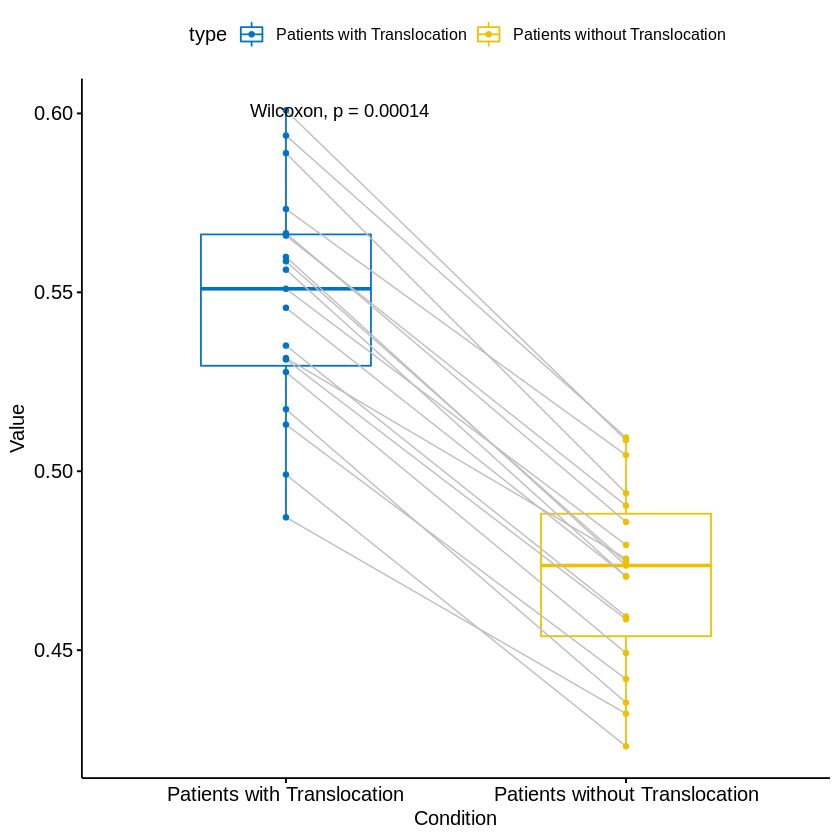

In [30]:
# p <- ggboxplot(cor_414_bound, x = "type", y = "cor",
#           color = "type", palette = "jco",
#           add = "jitter")
# p + stat_compare_means(paired = TRUE)

ggpaired(cor_414_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

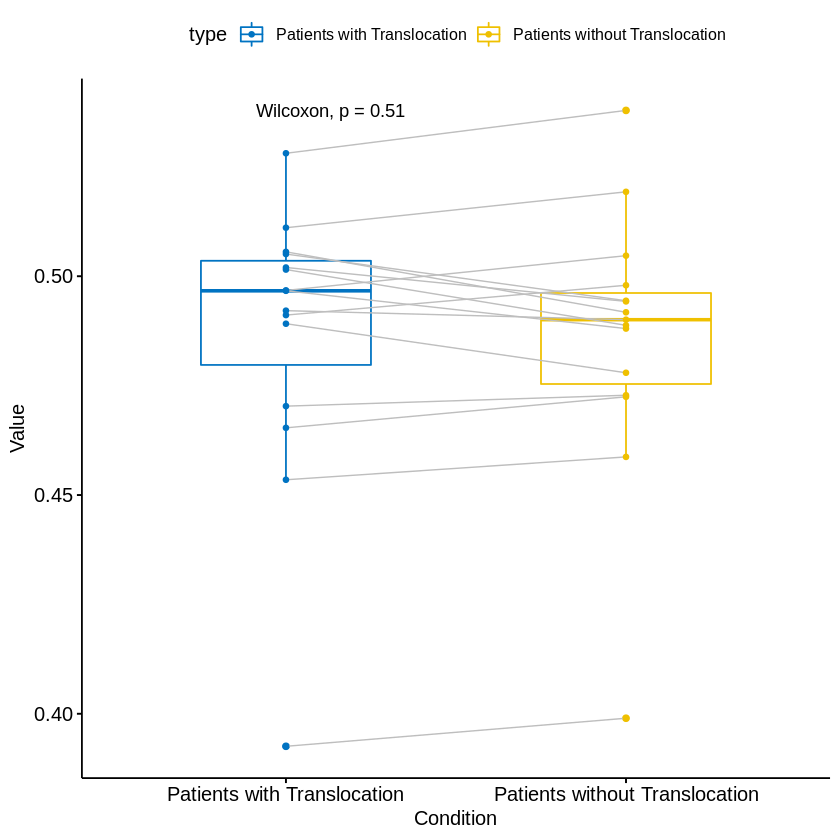

In [31]:
cor_1114 = MM.cor.keats[,cell_names_1114]

cor_1114_carrier = cor_1114[keepc1114,]
cor_1114_opat = cor_1114[!keepc1114,]

cor_1114_carrier = colMeans(cor_1114_carrier)
cor_1114_opat = colMeans(cor_1114_opat)

cor_1114_carrier = as.data.frame(cor_1114_carrier)
cor_1114_carrier$type = 'Patients with Translocation'
cor_1114_opat = as.data.frame(cor_1114_opat)
cor_1114_opat$type = 'Patients without Translocation'

colnames(cor_1114_carrier) = c('cor', 'type')
colnames(cor_1114_opat) = c('cor', 'type')

cor_1114_bound = rbind(cor_1114_carrier, cor_1114_opat)

ggpaired(cor_1114_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

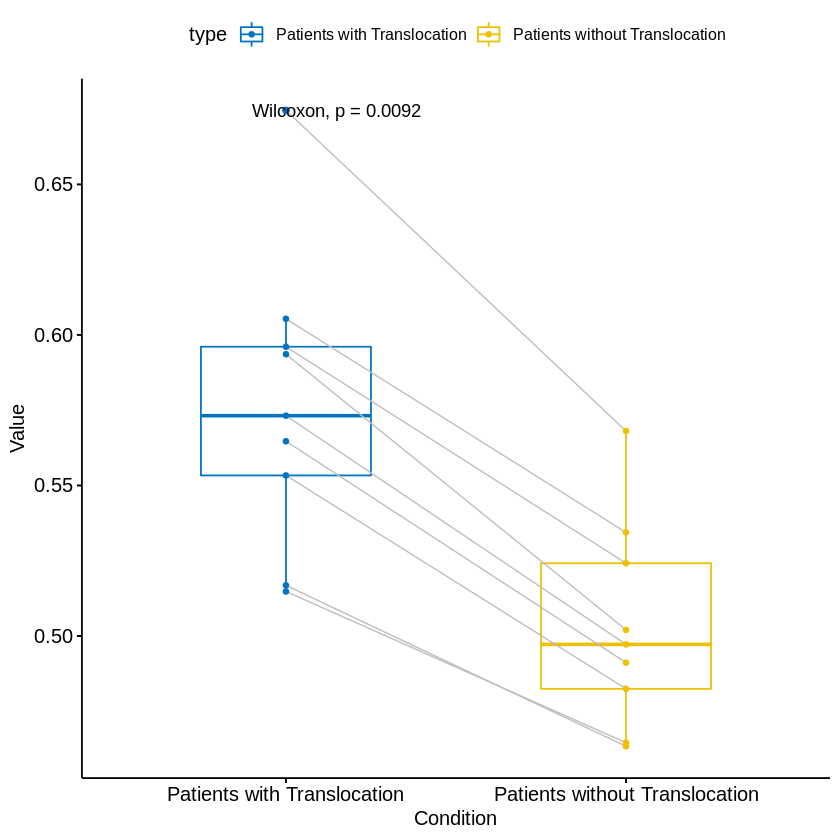

In [32]:
cor_1416 = MM.cor.keats[,cell_names_1416]

cor_1416_carrier = cor_1416[keepc1416,]
cor_1416_opat = cor_1416[!keepc1416,]

cor_1416_carrier = colMeans(cor_1416_carrier)
cor_1416_opat = colMeans(cor_1416_opat)

cor_1416_carrier = as.data.frame(cor_1416_carrier)
cor_1416_carrier$type = 'Patients with Translocation'
cor_1416_opat = as.data.frame(cor_1416_opat)
cor_1416_opat$type = 'Patients without Translocation'

colnames(cor_1416_carrier) = c('cor', 'type')
colnames(cor_1416_opat) = c('cor', 'type')

cor_1416_bound = rbind(cor_1416_carrier, cor_1416_opat)

ggpaired(cor_1416_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

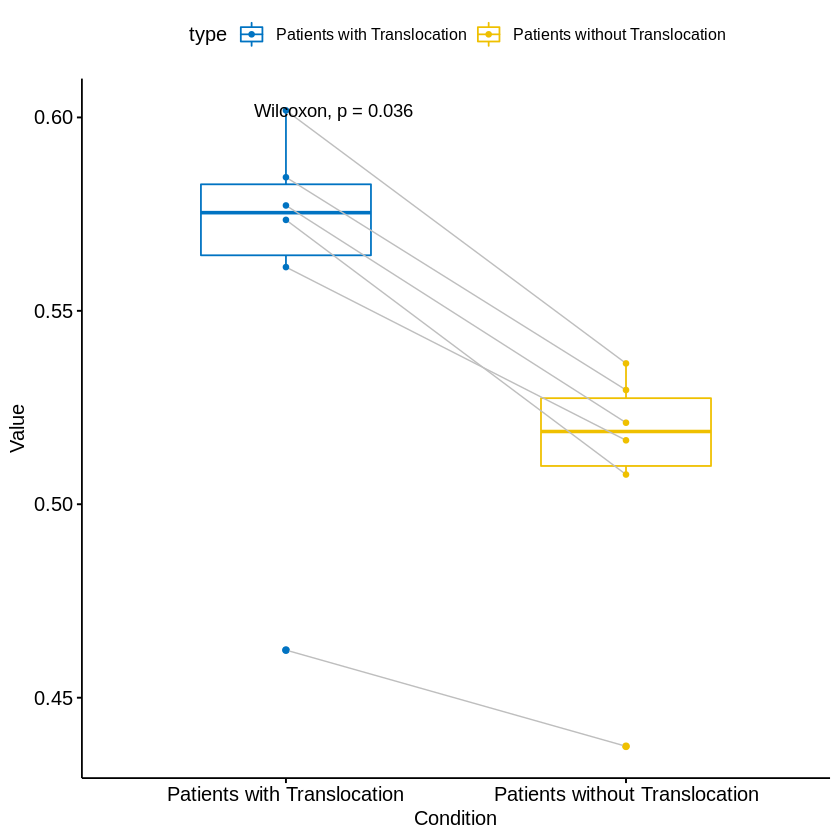

In [33]:
cor_1420 = MM.cor.keats[,cell_names_1420]

cor_1420_carrier = cor_1420[keepc1420,]
cor_1420_opat = cor_1420[!keepc1420,]

cor_1420_carrier = colMeans(cor_1420_carrier)
cor_1420_opat = colMeans(cor_1420_opat)

cor_1420_carrier = as.data.frame(cor_1420_carrier)
cor_1420_carrier$type = 'Patients with Translocation'
cor_1420_opat = as.data.frame(cor_1420_opat)
cor_1420_opat$type = 'Patients without Translocation'

colnames(cor_1420_carrier) = c('cor', 'type')
colnames(cor_1420_opat) = c('cor', 'type')

cor_1420_bound = rbind(cor_1420_carrier, cor_1420_opat)

ggpaired(cor_1420_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

In [34]:
cell_names_KRAS = c('COLO677_DSMZ_p8', 'JIM3_ECACC_p10', 'JK6L_p5', 
                    'JMW1_PLB_p6', 'Karpas620_DSMZ_p14', 'KHM1B_JCRB_p12', 
                    'KMS20_JCRB_p18', 'KMS28BM_JCRB_p9', 'KMS28PE_JCRB_p9', 
                    'KP6_DJ_p8', 'MM1R_ATCC_p7', 'MM1S_ATCC_p7', 'OCIMY1_p6', 
                    'RPMI8226_ATCC_p7', 'XG2_p5', 'XG6_p5', 'XG7_p6')

cell_names_NRAS = c('Karpas417_ECACC_p12', 'Karpas929_ECACC_p10', 'KHM11_p7', 
                    'KMM1_JCRB_p13', 'KMS21BM_JCRB_p10', 'KMS27_JCRB_p8', 
                    'L363_DSMZ_p8', 'MOLP8_DSMZ_p9', 'NCIH929_DSMZ_p8', 
                    'OCIMY7_p8', 'OH2_PLB_p8', 'PE2_PLB_p9', 'XG1_p5')



cell_names_BRAF = c('DP6_DJ_p7', 'U266_ATCC_p8')

cell_names_DIS3 = c('Karpas620_DSMZ_p14', 'KMM1_JCRB_p13', 'KMS26_JCRB_p9',
                    'KMS27_JCRB_p8', 'OPM1_p7', 'OPM2_DSMZ_p9', 'PCM6_Riken_p6', 'PE2_PLB_p9')

cell_names_FAM46C = c('ALMC1_DJ_p27', 'INA6_p5', 'JK6L_p5', 'MM1R_ATCC_p7', 'MM1S_ATCC_p7', 
                      'MOLP8_DSMZ_p9', 'NCIH929_DSMZ_p8', 'OPM2_DSMZ_p9', 'SKMM1_p6', 'XG7_p6')

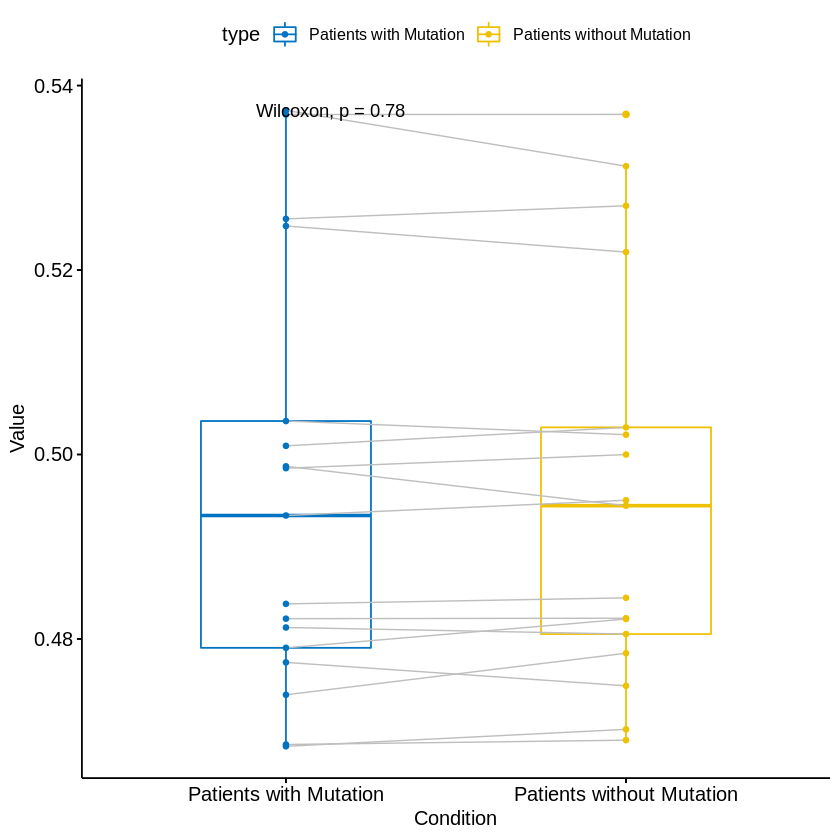

In [35]:
cor_KRAS = MM.cor.keats[,cell_names_KRAS]

cor_KRAS_carrier = cor_KRAS[keepcKRAS,]
cor_KRAS_opat = cor_KRAS[!keepcKRAS,]

cor_KRAS_carrier = colMeans(cor_KRAS_carrier)
cor_KRAS_opat = colMeans(cor_KRAS_opat)

cor_KRAS_carrier = as.data.frame(cor_KRAS_carrier)
cor_KRAS_carrier$type = 'Patients with Mutation'
cor_KRAS_opat = as.data.frame(cor_KRAS_opat)
cor_KRAS_opat$type = 'Patients without Mutation'

colnames(cor_KRAS_carrier) = c('cor', 'type')
colnames(cor_KRAS_opat) = c('cor', 'type')

cor_KRAS_bound = rbind(cor_KRAS_carrier, cor_KRAS_opat)

ggpaired(cor_KRAS_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

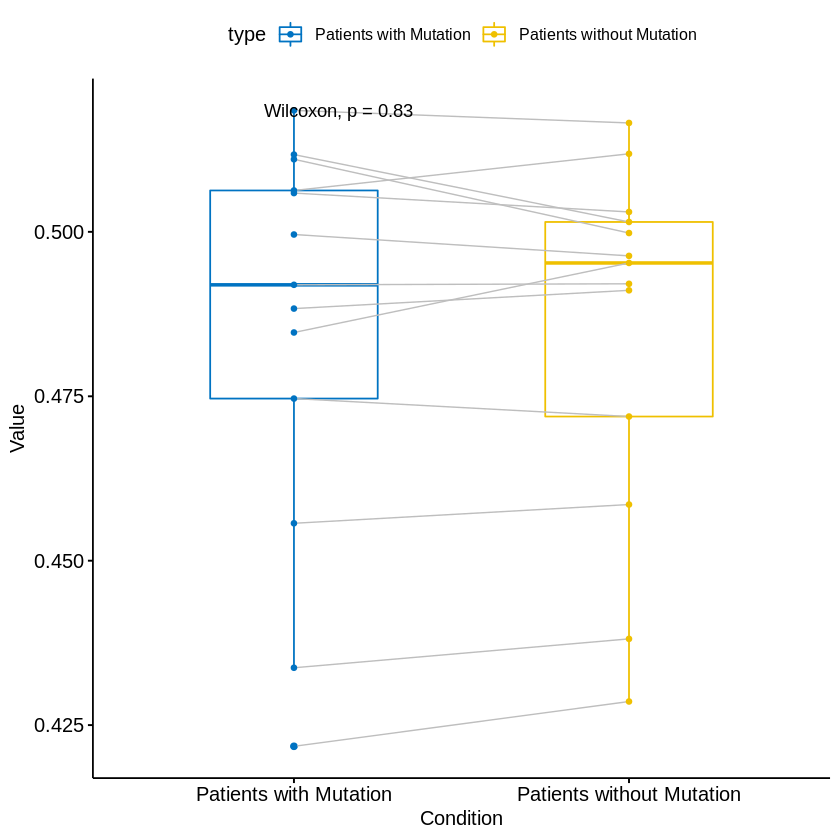

In [36]:
cor_NRAS = MM.cor.keats[,cell_names_NRAS]

cor_NRAS_carrier = cor_NRAS[keepcNRAS,]
cor_NRAS_opat = cor_NRAS[!keepcNRAS,]

cor_NRAS_carrier = colMeans(cor_NRAS_carrier)
cor_NRAS_opat = colMeans(cor_NRAS_opat)

cor_NRAS_carrier = as.data.frame(cor_NRAS_carrier)
cor_NRAS_carrier$type = 'Patients with Mutation'
cor_NRAS_opat = as.data.frame(cor_NRAS_opat)
cor_NRAS_opat$type = 'Patients without Mutation'

colnames(cor_NRAS_carrier) = c('cor', 'type')
colnames(cor_NRAS_opat) = c('cor', 'type')

cor_NRAS_bound = rbind(cor_NRAS_carrier, cor_NRAS_opat)

ggpaired(cor_NRAS_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

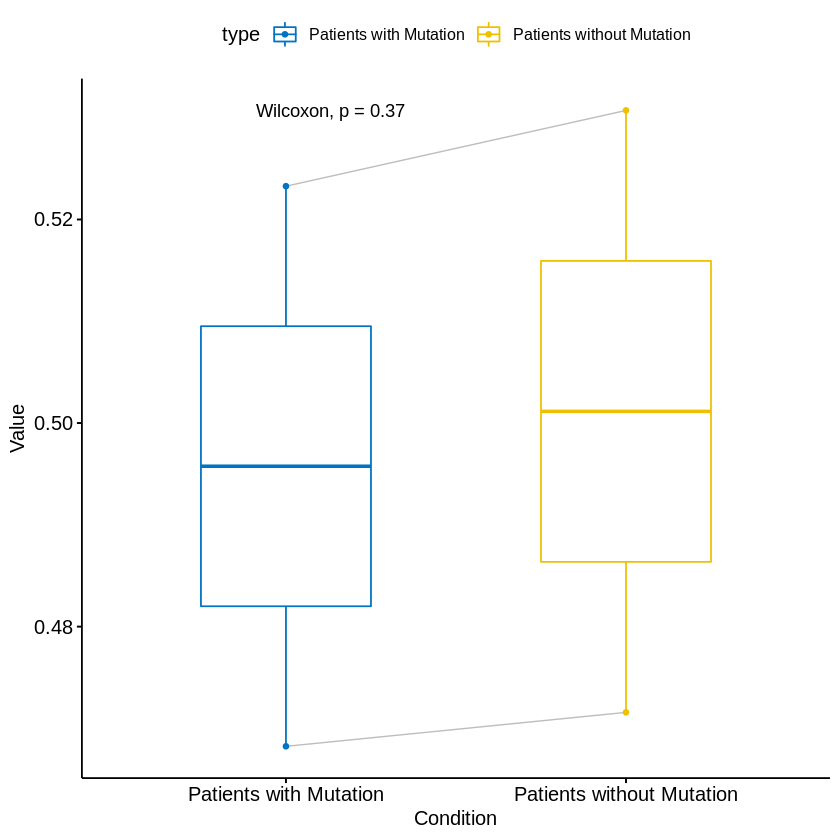

In [37]:
cor_BRAF = MM.cor.keats[,cell_names_BRAF]

cor_BRAF_carrier = cor_BRAF[keepcBRAF,]
cor_BRAF_opat = cor_BRAF[!keepcBRAF,]

cor_BRAF_carrier = colMeans(cor_BRAF_carrier)
cor_BRAF_opat = colMeans(cor_BRAF_opat)

cor_BRAF_carrier = as.data.frame(cor_BRAF_carrier)
cor_BRAF_carrier$type = 'Patients with Mutation'
cor_BRAF_opat = as.data.frame(cor_BRAF_opat)
cor_BRAF_opat$type = 'Patients without Mutation'

colnames(cor_BRAF_carrier) = c('cor', 'type')
colnames(cor_BRAF_opat) = c('cor', 'type')

cor_BRAF_bound = rbind(cor_BRAF_carrier, cor_BRAF_opat)

ggpaired(cor_BRAF_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

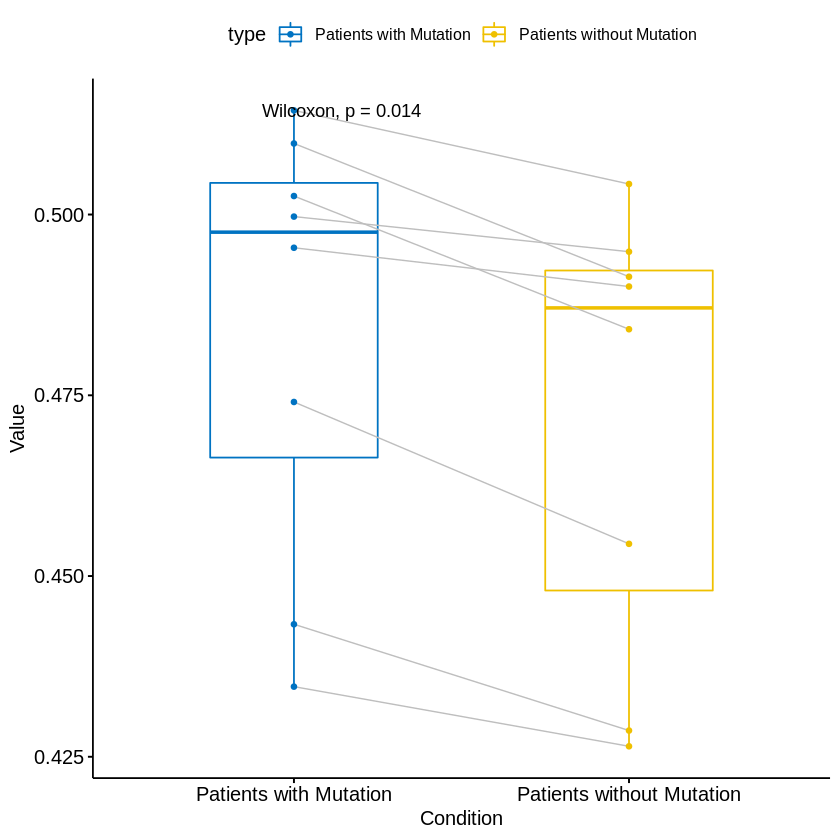

In [38]:
cor_DIS3 = MM.cor.keats[,cell_names_DIS3]

cor_DIS3_carrier = cor_DIS3[keepcDIS3,]
cor_DIS3_opat = cor_DIS3[!keepcDIS3,]

cor_DIS3_carrier = colMeans(cor_DIS3_carrier)
cor_DIS3_opat = colMeans(cor_DIS3_opat)

cor_DIS3_carrier = as.data.frame(cor_DIS3_carrier)
cor_DIS3_carrier$type = 'Patients with Mutation'
cor_DIS3_opat = as.data.frame(cor_DIS3_opat)
cor_DIS3_opat$type = 'Patients without Mutation'

colnames(cor_DIS3_carrier) = c('cor', 'type')
colnames(cor_DIS3_opat) = c('cor', 'type')

cor_DIS3_bound = rbind(cor_DIS3_carrier, cor_DIS3_opat)

ggpaired(cor_DIS3_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

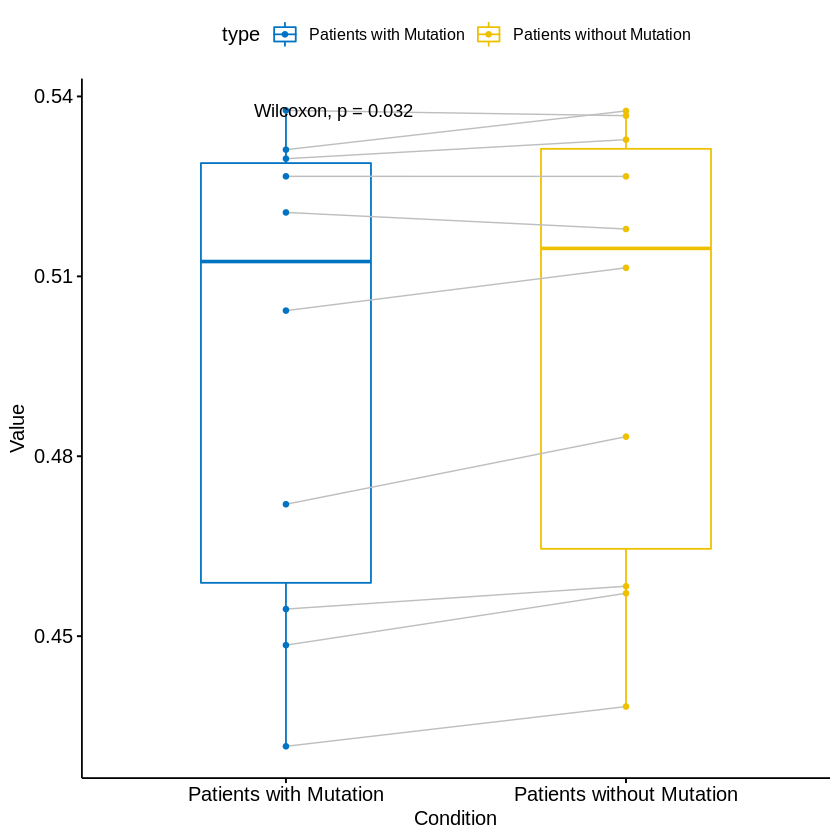

In [39]:
cor_FAM46C = MM.cor.keats[,cell_names_FAM46C]

cor_FAM46C_carrier = cor_FAM46C[keepcFAM46C,]
cor_FAM46C_opat = cor_FAM46C[!keepcFAM46C,]

cor_FAM46C_carrier = colMeans(cor_FAM46C_carrier)
cor_FAM46C_opat = colMeans(cor_FAM46C_opat)

cor_FAM46C_carrier = as.data.frame(cor_FAM46C_carrier)
cor_FAM46C_carrier$type = 'Patients with Mutation'
cor_FAM46C_opat = as.data.frame(cor_FAM46C_opat)
cor_FAM46C_opat$type = 'Patients without Mutation'

colnames(cor_FAM46C_carrier) = c('cor', 'type')
colnames(cor_FAM46C_opat) = c('cor', 'type')

cor_FAM46C_bound = rbind(cor_FAM46C_carrier, cor_FAM46C_opat)

ggpaired(cor_FAM46C_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)

In [41]:
# cor_FAM46C = MM.cor.keats[,cell_names_FAM46C]

# cor_FAM46C_carrier = cor_FAM46C[keepcFAM46C,]
# cor_FAM46C_opat = cor_FAM46C[!keepcFAM46C,]



# cor_FAM46C_carrier = as.data.frame(cor_FAM46C_carrier)
# #cor_FAM46C_carrier$type = 'Patients with Mutation'
# cor_FAM46C_opat = as.data.frame(cor_FAM46C_opat)
# #cor_FAM46C_opat$type = 'Patients without Mutation'

# colnames(cor_FAM46C_carrier) = c('cor', 'type')
# colnames(cor_FAM46C_opat) = c('cor', 'type')

# cor_FAM46C_bound = rbind(cor_FAM46C_carrier, cor_FAM46C_opat)

# ggpaired(cor_FAM46C_bound, x = "type", y = "cor",
#          color = "type", line.color = "gray", line.size = 0.4,
#          palette = "jco")+
#   stat_compare_means(paired = TRUE)

In [42]:
cell_names_il6 = c('ALMC1_DJ_p27','ALMC2_DJ_p11','ANBL6_DJ2_p13','DP6_DJ_p7','INA6_p5','JK6L_p5','JMW1_PLB_p6','KAS61_DJ_p5'
,'KP6_DJ_p8','OH2_PLB_p8','PCM6_Riken_p6','PE1_PLB_p10','PE2_PLB_p9','VP6_DJ_p5','XG1_p5','XG2_p5','XG6_p5'
,'XG7_p6')


il6_bool = colnames(MM_cell_line) %in% cell_names_il6

,ALMC1_DJ_p27,ALMC2_DJ_p11,ANBL6_DJ2_p13,DP6_DJ_p7,INA6_p5,JK6L_p5,JMW1_PLB_p6,KAS61_DJ_p5,KP6_DJ_p8,OH2_PLB_p8,PCM6_Riken_p6,PE1_PLB_p10,PE2_PLB_p9,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
MMRF_2801_1_BM,0.4836378,0.4686470,0.5159783,0.4432058,0.4699845,0.4875194,0.4412373,0.4525338,0.4390563,0.4572857,0.4644354,0.4510411,0.4290581,0.4448189,0.4333487,0.4284234,0.4318117,0.4243849
MMRF_2718_1_BM,0.4849495,0.4742135,0.4986851,0.4297896,0.4509466,0.4481267,0.4648434,0.4687803,0.4281954,0.4472955,0.4525253,0.4296183,0.4380889,0.4212332,0.4175788,0.3938507,0.4134381,0.3975064
MMRF_2815_1_BM,0.5091862,0.5064330,0.5271903,0.4921401,0.4580690,0.4831242,0.5469566,0.5370008,0.4971264,0.4512526,0.4768998,0.4604243,0.4965979,0.4492242,0.4476904,0.4208229,0.4527162,0.5060379
MMRF_1656_1_BM,0.5877339,0.5993928,0.6033711,0.6000781,0.5749246,0.6075645,0.5581836,0.5773772,0.6034804,0.5731498,0.5446131,0.5338652,0.5373743,0.5496792,0.5424570,0.5512444,0.5797852,0.5676018
MMRF_2461_1_BM,0.4458148,0.4464983,0.4731300,0.4378271,0.4154696,0.4361678,0.3976243,0.4363872,0.4220858,0.4188304,0.4657400,0.3818529,0.3709558,0.3959002,0.3969621,0.3828487,0.4399801,0.4236413
MMRF_2057_1_BM,0.5746095,0.5751956,0.6114980,0.5667370,0.5871492,0.5721068,0.5062526,0.5449854,0.5422982,0.5582047,0.5167119,0.5471663,0.5194097,0.5289913,0.5552722,0.5130774,0.5647444,0.5132685


,AMO1_DSMZ_p8,COLO677_DSMZ_p8,Delta47_JCRB_p16,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,H1112_p5,JIM1_ECACC_p11,JIM3_ECACC_p10,JJN3_DSMZ_p8,⋯,OCIMY1_p6,OCIMY5_p10,OCIMY7_p8,OPM1_p7,OPM2_DSMZ_p9,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6
MMRF_2801_1_BM,0.4673668,0.4629237,0.4362713,0.4562471,0.4641367,0.3809849,0.4797757,0.4034523,0.4546872,0.4731079,⋯,0.4413702,0.4925486,0.4487061,0.3659932,0.3932352,0.4822432,0.4170597,0.4518690,0.4246406,0.3811980
MMRF_2718_1_BM,0.4445732,0.4238263,0.3830669,0.4505229,0.4578769,0.3609131,0.4445421,0.3822892,0.4164833,0.4589806,⋯,0.4415153,0.4321207,0.4188053,0.3736552,0.4055411,0.4499876,0.3868856,0.4312632,0.4052534,0.4083806
MMRF_2815_1_BM,0.4771496,0.4292123,0.4188493,0.4548180,0.4632074,0.3782369,0.4824497,0.4611839,0.4938072,0.4729271,⋯,0.4808968,0.4609676,0.4617665,0.4272215,0.4712077,0.4585764,0.4255826,0.4658892,0.4159600,0.4697735
MMRF_1656_1_BM,0.5491432,0.5202250,0.5126301,0.5334721,0.5721010,0.4599265,0.5393101,0.5106210,0.5450060,0.5527335,⋯,0.5814488,0.5420585,0.5631427,0.4922971,0.5150611,0.5209036,0.4941841,0.5514529,0.4984455,0.4998297
MMRF_2461_1_BM,0.4315844,0.4183847,0.3849694,0.4082587,0.4347655,0.3289497,0.4076040,0.3629806,0.4237630,0.4187224,⋯,0.3995652,0.4030774,0.4201441,0.3346399,0.3619527,0.4180156,0.3369164,0.3819786,0.3803042,0.3383132
MMRF_2057_1_BM,0.4935160,0.4710572,0.5040224,0.5380960,0.5972272,0.4307854,0.5197822,0.4862985,0.4962701,0.4924452,⋯,0.5102678,0.4807193,0.5338886,0.4721868,0.5005648,0.4736886,0.4809370,0.5447272,0.5161323,0.4839423


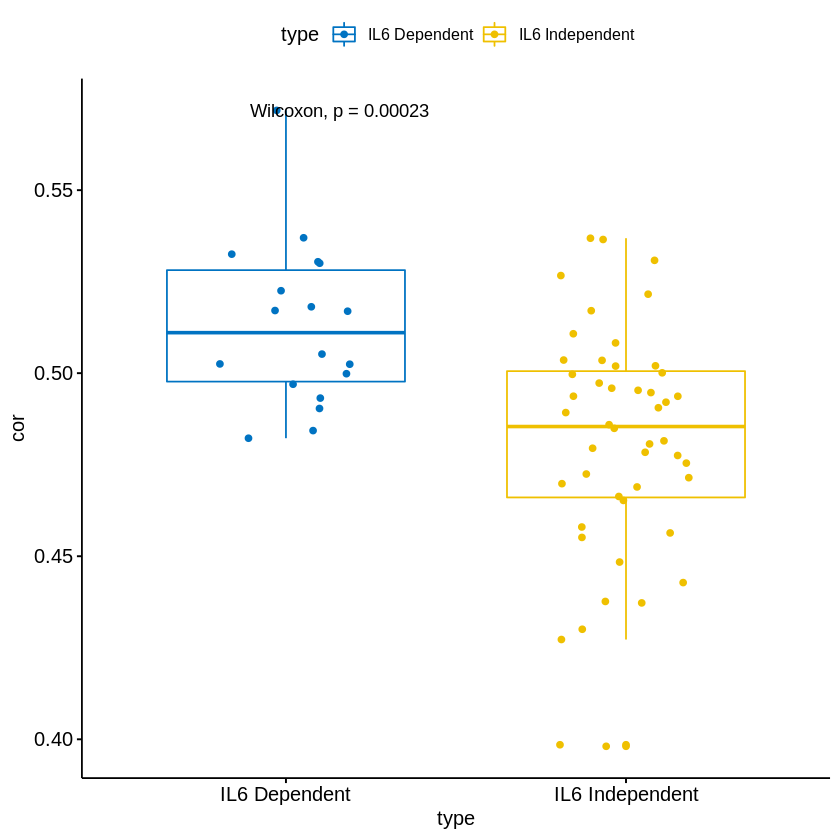

In [43]:



cor_il6_dep = MM.cor.keats[,cell_names_il6]
cor_il6_ndep = MM.cor.keats[,!il6_bool]

head(cor_il6_dep)
head(cor_il6_ndep)


cor_il6_dep = colMeans(cor_il6_dep)
cor_il6_ndep = colMeans(cor_il6_ndep)

cor_il6_dep = as.data.frame(cor_il6_dep)
cor_il6_dep$type = 'IL6 Dependent'
cor_il6_ndep = as.data.frame(cor_il6_ndep)
cor_il6_ndep$type = 'IL6 Independent'

colnames(cor_il6_dep) = c('cor', 'type')
colnames(cor_il6_ndep) = c('cor', 'type')

cor_il6_bound = rbind(cor_il6_dep, cor_il6_ndep)


p <- ggboxplot(cor_il6_bound, x = "type", y = "cor",
          color = "type", palette = "jco",
          add = "jitter")
p + stat_compare_means()


In [44]:
ccle_bool = colnames(MM.cor.ccle) %in% colnames(MM.cor.keats)

In [45]:
head(MM.cor.ccle)
cor_ccle = MM.cor.ccle[,ccle_bool]
head(cor_ccle)

,AMO1_DSMZ_p8,EJM_DSMZ_p9,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,JJN3_DSMZ_p8,Karpas620_DSMZ_p14,KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KHM1B_JCRB_p12,KMM1_JCRB_p13,KMS11_JCRB_Sus_p12,KMS12BM_JCRB_p9,⋯,L363_DSMZ_p8,LP1_DSMZ_p9,MM1S_ATCC_p7,MOLP2_DSMZ_p18,MOLP8_DSMZ_p9,NCIH929_DSMZ_p8,OPM2_DSMZ_p9,RPMI8226_ATCC_p7,SKMM2_DSMZ_p17,U266_ATCC_p8
MMRF_2801_1_BM,0.5039581,0.4920968,0.4506607,0.5035400,0.5040112,0.4685971,0.4485621,0.3974373,0.4333748,0.5080662,⋯,0.4798732,0.4506603,0.4975035,0.5253753,0.4586451,0.4727095,0.4339002,0.4921976,0.4664182,0.4633109
MMRF_2718_1_BM,0.4605498,0.4750617,0.4343354,0.4839602,0.4849160,0.4508199,0.4130524,0.3951616,0.4486378,0.4512746,⋯,0.4506717,0.4791804,0.4829110,0.4632297,0.4261210,0.4341703,0.4333351,0.4533886,0.4390122,0.4491175
MMRF_2815_1_BM,0.4748134,0.4684548,0.4217429,0.4916215,0.4740706,0.4552962,0.4127452,0.3847460,0.4857255,0.4143103,⋯,0.4486637,0.5433457,0.5260749,0.4768965,0.4523233,0.4982941,0.4862659,0.4500183,0.4671324,0.4333869
MMRF_1656_1_BM,0.5606936,0.5465071,0.4817067,0.5663151,0.5710594,0.5207093,0.5005300,0.4898367,0.5415043,0.4952852,⋯,0.5407061,0.5614059,0.6177540,0.5671795,0.5429852,0.5957694,0.5369808,0.5030716,0.5313682,0.4986228
MMRF_2461_1_BM,0.4492349,0.4473054,0.4032457,0.4462340,0.4462662,0.4445144,0.4018028,0.3384326,0.3827268,0.4025347,⋯,0.4150288,0.4411939,0.4479695,0.4877246,0.4021942,0.4203391,0.3969750,0.4214464,0.3878265,0.3995958
MMRF_2057_1_BM,0.4959185,0.5499780,0.4093202,0.5124752,0.4901212,0.4311738,0.5041642,0.4653826,0.4843200,0.4582576,⋯,0.5150796,0.5378282,0.5458419,0.5208051,0.5128310,0.5416283,0.5088606,0.4531670,0.5334816,0.4912058


,AMO1_DSMZ_p8,EJM_DSMZ_p9,JJN3_DSMZ_p8,Karpas620_DSMZ_p14,KHM1B_JCRB_p12,KMM1_JCRB_p13,KMS11_JCRB_Sus_p12,KMS12BM_JCRB_p9,KMS18_p12,KMS20_JCRB_p18,⋯,L363_DSMZ_p8,LP1_DSMZ_p9,MM1S_ATCC_p7,MOLP2_DSMZ_p18,MOLP8_DSMZ_p9,NCIH929_DSMZ_p8,OPM2_DSMZ_p9,RPMI8226_ATCC_p7,SKMM2_DSMZ_p17,U266_ATCC_p8
MMRF_2801_1_BM,0.5039581,0.4920968,0.5035400,0.5040112,0.4485621,0.3974373,0.4333748,0.5080662,0.4859864,0.4936116,⋯,0.4798732,0.4506603,0.4975035,0.5253753,0.4586451,0.4727095,0.4339002,0.4921976,0.4664182,0.4633109
MMRF_2718_1_BM,0.4605498,0.4750617,0.4839602,0.4849160,0.4130524,0.3951616,0.4486378,0.4512746,0.4508372,0.4584257,⋯,0.4506717,0.4791804,0.4829110,0.4632297,0.4261210,0.4341703,0.4333351,0.4533886,0.4390122,0.4491175
MMRF_2815_1_BM,0.4748134,0.4684548,0.4916215,0.4740706,0.4127452,0.3847460,0.4857255,0.4143103,0.5307634,0.4831544,⋯,0.4486637,0.5433457,0.5260749,0.4768965,0.4523233,0.4982941,0.4862659,0.4500183,0.4671324,0.4333869
MMRF_1656_1_BM,0.5606936,0.5465071,0.5663151,0.5710594,0.5005300,0.4898367,0.5415043,0.4952852,0.5608239,0.5887942,⋯,0.5407061,0.5614059,0.6177540,0.5671795,0.5429852,0.5957694,0.5369808,0.5030716,0.5313682,0.4986228
MMRF_2461_1_BM,0.4492349,0.4473054,0.4462340,0.4462662,0.4018028,0.3384326,0.3827268,0.4025347,0.4378423,0.4398148,⋯,0.4150288,0.4411939,0.4479695,0.4877246,0.4021942,0.4203391,0.3969750,0.4214464,0.3878265,0.3995958
MMRF_2057_1_BM,0.4959185,0.5499780,0.5124752,0.4901212,0.5041642,0.4653826,0.4843200,0.4582576,0.5133635,0.4955756,⋯,0.5150796,0.5378282,0.5458419,0.5208051,0.5128310,0.5416283,0.5088606,0.4531670,0.5334816,0.4912058


In [46]:
head(MM.cor.keats)
cor_keats = MM.cor.keats[,colnames(cor_ccle)]
head(cor_keats)

,ALMC1_DJ_p27,ALMC2_DJ_p11,AMO1_DSMZ_p8,ANBL6_DJ2_p13,COLO677_DSMZ_p8,Delta47_JCRB_p16,DP6_DJ_p7,EJM_DSMZ_p9,FLAM76_JCRB_p10,FR4_p6,⋯,RPMI8226_ATCC_p7,SKMM1_p6,SKMM2_DSMZ_p17,U266_ATCC_p8,UTMC2_p6,VP6_DJ_p5,XG1_p5,XG2_p5,XG6_p5,XG7_p6
MMRF_2801_1_BM,0.4836378,0.4686470,0.4673668,0.5159783,0.4629237,0.4362713,0.4432058,0.4562471,0.4641367,0.3809849,⋯,0.4822432,0.4170597,0.4518690,0.4246406,0.3811980,0.4448189,0.4333487,0.4284234,0.4318117,0.4243849
MMRF_2718_1_BM,0.4849495,0.4742135,0.4445732,0.4986851,0.4238263,0.3830669,0.4297896,0.4505229,0.4578769,0.3609131,⋯,0.4499876,0.3868856,0.4312632,0.4052534,0.4083806,0.4212332,0.4175788,0.3938507,0.4134381,0.3975064
MMRF_2815_1_BM,0.5091862,0.5064330,0.4771496,0.5271903,0.4292123,0.4188493,0.4921401,0.4548180,0.4632074,0.3782369,⋯,0.4585764,0.4255826,0.4658892,0.4159600,0.4697735,0.4492242,0.4476904,0.4208229,0.4527162,0.5060379
MMRF_1656_1_BM,0.5877339,0.5993928,0.5491432,0.6033711,0.5202250,0.5126301,0.6000781,0.5334721,0.5721010,0.4599265,⋯,0.5209036,0.4941841,0.5514529,0.4984455,0.4998297,0.5496792,0.5424570,0.5512444,0.5797852,0.5676018
MMRF_2461_1_BM,0.4458148,0.4464983,0.4315844,0.4731300,0.4183847,0.3849694,0.4378271,0.4082587,0.4347655,0.3289497,⋯,0.4180156,0.3369164,0.3819786,0.3803042,0.3383132,0.3959002,0.3969621,0.3828487,0.4399801,0.4236413
MMRF_2057_1_BM,0.5746095,0.5751956,0.4935160,0.6114980,0.4710572,0.5040224,0.5667370,0.5380960,0.5972272,0.4307854,⋯,0.4736886,0.4809370,0.5447272,0.5161323,0.4839423,0.5289913,0.5552722,0.5130774,0.5647444,0.5132685


,AMO1_DSMZ_p8,EJM_DSMZ_p9,JJN3_DSMZ_p8,Karpas620_DSMZ_p14,KHM1B_JCRB_p12,KMM1_JCRB_p13,KMS11_JCRB_Sus_p12,KMS12BM_JCRB_p9,KMS18_p12,KMS20_JCRB_p18,⋯,L363_DSMZ_p8,LP1_DSMZ_p9,MM1S_ATCC_p7,MOLP2_DSMZ_p18,MOLP8_DSMZ_p9,NCIH929_DSMZ_p8,OPM2_DSMZ_p9,RPMI8226_ATCC_p7,SKMM2_DSMZ_p17,U266_ATCC_p8
MMRF_2801_1_BM,0.4673668,0.4562471,0.4731079,0.4921371,0.4254129,0.3806225,0.4274935,0.5006807,0.4497052,0.4485385,⋯,0.4482483,0.4129649,0.4669039,0.4943391,0.4285214,0.4549121,0.3932352,0.4822432,0.4518690,0.4246406
MMRF_2718_1_BM,0.4445732,0.4505229,0.4589806,0.4765847,0.3870918,0.3884877,0.4247725,0.4366829,0.4312164,0.4183374,⋯,0.4271259,0.4424903,0.4696201,0.4488484,0.4113562,0.4215528,0.4055411,0.4499876,0.4312632,0.4052534
MMRF_2815_1_BM,0.4771496,0.4548180,0.4729271,0.4701697,0.4093895,0.4057427,0.4879803,0.4167777,0.5085335,0.4683514,⋯,0.4335089,0.4997834,0.5176563,0.4635870,0.4328909,0.5060657,0.4712077,0.4585764,0.4658892,0.4159600
MMRF_1656_1_BM,0.5491432,0.5334721,0.5527335,0.5693685,0.5009793,0.4790330,0.5414798,0.5047992,0.5438584,0.5737132,⋯,0.5483577,0.5362321,0.6060320,0.5707406,0.5165505,0.6089285,0.5150611,0.5209036,0.5514529,0.4984455
MMRF_2461_1_BM,0.4315844,0.4082587,0.4187224,0.4388577,0.3925248,0.3460373,0.3853988,0.3999826,0.4067667,0.4225298,⋯,0.3874653,0.3765732,0.4251734,0.4649626,0.3687259,0.4107223,0.3619527,0.4180156,0.3819786,0.3803042
MMRF_2057_1_BM,0.4935160,0.5380960,0.4924452,0.4827985,0.5242224,0.4665961,0.4969552,0.4697971,0.5065338,0.4898366,⋯,0.5262518,0.5034078,0.5403312,0.5340702,0.4978372,0.5396234,0.5005648,0.4736886,0.5447272,0.5161323


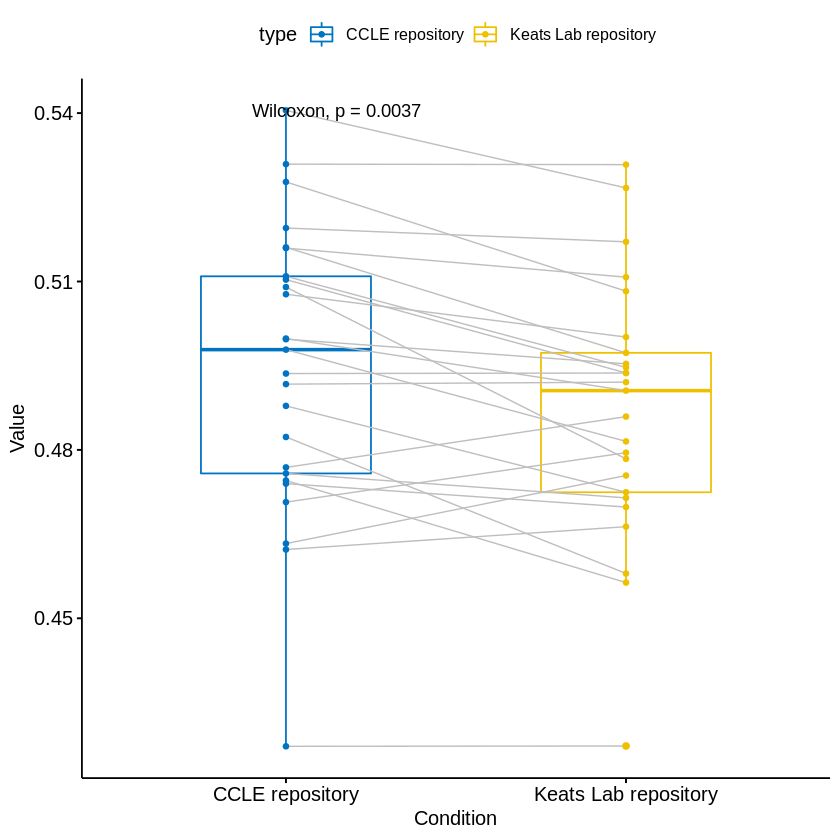

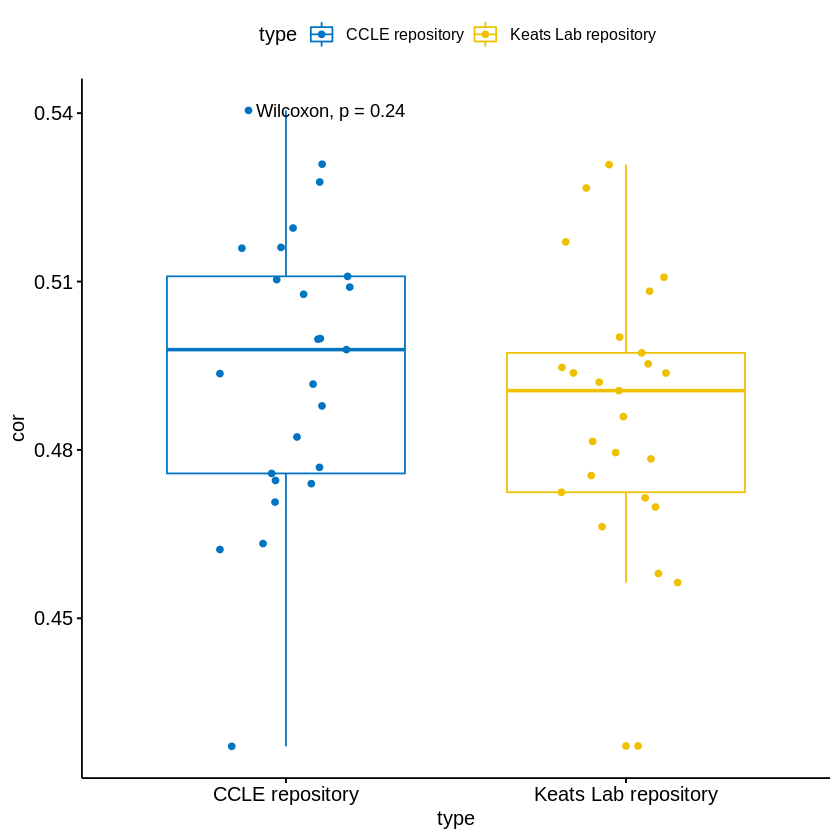

In [47]:
cor_ccle = colMeans(cor_ccle)
cor_keats = colMeans(cor_keats)

cor_ccle = as.data.frame(cor_ccle)
cor_ccle$type = 'CCLE repository'
cor_keats = as.data.frame(cor_keats)
cor_keats$type = 'Keats Lab repository'

colnames(cor_ccle) = c('cor', 'type')
colnames(cor_keats) = c('cor', 'type')

cor_repo_bound = rbind(cor_ccle, cor_keats)

ggpaired(cor_repo_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means(paired = TRUE)


p <- ggboxplot(cor_repo_bound, x = "type", y = "cor",
          color = "type", palette = "jco",
          add = "jitter")
p + stat_compare_means()

In [48]:
library(fgsea)

Loading required package: Rcpp


In [49]:
combined_annot = data.frame(colnames(norm_combined))
head(combined_annot)

combined_annot$type = "Patient"
combined_annot$type[1:ncol(norm_cell)] = "Cell_Line"
tail(combined_annot)
rn = combined_annot[,1]
combined_annot = combined_annot[-1]
rownames(combined_annot) = rn


set = newSeqExpressionSet(as.matrix(norm_combined), 
                          phenoData = combined_annot)


x <- as.factor(combined_annot$type)
design <- model.matrix(~x, data=pData(set))
y <- DGEList(counts=counts(set), group=x)
y <- calcNormFactors(y, method="upperquartile")
y <- estimateGLMCommonDisp(y, design)
y <- estimateGLMTagwiseDisp(y, design)
fit <- glmFit(y, design)
lrt <- glmLRT(fit, coef=2)
top <- topTags(lrt, n=nrow(set))$table
head(top)


colnames.norm_combined.
<fct>
ALMC1_DJ_p27
ALMC2_DJ_p11
AMO1_DSMZ_p8
ANBL6_DJ2_p13
COLO677_DSMZ_p8
Delta47_JCRB_p16


,colnames.norm_combined.,type
,<fct>,<chr>
840,MMRF_1641_1_BM,Patient
841,MMRF_2795_1_BM,Patient
842,MMRF_2316_1_BM,Patient
843,MMRF_2440_1_BM,Patient
844,MMRF_2731_1_BM,Patient
845,MMRF_1355_1_BM,Patient


Warning message in validityMethod(object):
"'counts' contains non-integer numbers"

,logFC,logCPM,LR,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000215472,-1.599601,5.388916,787.5075,2.806625e-173,6.303399e-169
ENSG00000256061,-1.350720,5.467159,554.8173,1.127304e-122,1.265907e-118
ENSG00000125740,1.360915,6.620002,516.3322,2.657790e-114,1.989710e-110
ENSG00000145337,-1.229030,5.345795,395.0875,6.461566e-88,3.628008e-84
ENSG00000225339,-1.227788,5.337219,391.0504,4.888731e-87,2.195920e-83
ENSG00000103426,-1.222245,5.336532,386.5457,4.676254e-86,1.750400e-82


In [50]:
gene_ranks = top[,'logFC']
head(gene_ranks)

[1] -1.599601 -1.350720  1.360915 -1.229030 -1.227788 -1.222245

In [51]:
gene_info = as.data.frame(gene_info)
rownames(gene_info) = gene_info$ensembl_ids
head(gene_info)
gene_info$ensembl_ids = NULL

,ensembl_ids,gene_names
,<fct>,<fct>
ENSG00000000003,ENSG00000000003,TSPAN6
ENSG00000000005,ENSG00000000005,TNMD
ENSG00000000419,ENSG00000000419,DPM1
ENSG00000000457,ENSG00000000457,SCYL3
ENSG00000000460,ENSG00000000460,C1orf112
ENSG00000000938,ENSG00000000938,FGR


In [52]:
gr_symb = gene_info[rownames(top),]
head(gr_symb)

[1] RPL17         DYX1C1        FOSB          PIGY          RP11-513I15.6
[6] CORO7        
47040 Levels: 5_8S_rRNA 5S_rRNA 7SK A1BG A1CF A2LD1 A2M A2ML1 ... ZZZ3

In [53]:
names(gene_ranks) = gr_symb
head(gene_ranks)

RPL17        DYX1C1          FOSB          PIGY RP11-513I15.6 
    -1.599601     -1.350720      1.360915     -1.229030     -1.227788 
        CORO7 
    -1.222245

In [54]:
hmgs = gmtPathways('h.all.v6.2.symbols.gmt')
head(hmgs)

$HALLMARK_TNFA_SIGNALING_VIA_NFKB
  [1] "JUNB"     "CXCL2"    "ATF3"     "NFKBIA"   "TNFAIP3"  "PTGS2"   
  [7] "CXCL1"    "IER3"     "CD83"     "CCL20"    "CXCL3"    "MAFF"    
 [13] "NFKB2"    "TNFAIP2"  "HBEGF"    "KLF6"     "BIRC3"    "PLAUR"   
 [19] "ZFP36"    "ICAM1"    "JUN"      "EGR3"     "IL1B"     "BCL2A1"  
 [25] "PPP1R15A" "ZC3H12A"  "SOD2"     "NR4A2"    "IL1A"     "RELB"    
 [31] "TRAF1"    "BTG2"     "DUSP1"    "MAP3K8"   "ETS2"     "F3"      
 [37] "SDC4"     "EGR1"     "IL6"      "TNF"      "KDM6B"    "NFKB1"   
 [43] "LIF"      "PTX3"     "FOSL1"    "NR4A1"    "JAG1"     "CCL4"    
 [49] "GCH1"     "CCL2"     "RCAN1"    "DUSP2"    "EHD1"     "IER2"    
 [55] "REL"      "CFLAR"    "RIPK2"    "NFKBIE"   "NR4A3"    "PHLDA1"  
 [61] "IER5"     "TNFSF9"   "GEM"      "GADD45A"  "CXCL10"   "PLK2"    
 [67] "BHLHE40"  "EGR2"     "SOCS3"    "SLC2A6"   "PTGER4"   "DUSP5"   
 [73] "SERPINB2" "NFIL3"    "SERPINE1" "TRIB1"    "TIPARP"   "RELA"    
 [79] "BIRC2"    "CXCL6"    "LITAF"    "TNFAIP6"  "CD44"     "INHBA"   
 [85] "PLAU"     "MYC"      "TNFRSF9"  "SGK1"     "TNIP1"    "NAMPT"   
 [91] "FOSL2"    "PNRC1"    "ID2"      "CD69"     "IL7R"     "EFNA1"   
 [97] "PHLDA2"   "PFKFB3"   "CCL5"     "YRDC"     "IFNGR2"   "SQSTM1"  
[103] "BTG3"     "GADD45B"  "KYNU"     "G0S2"     "BTG1"     "MCL1"    
[109] "VEGFA"    "MAP2K3"   "CDKN1A"   "CYR61"    "TANK"     "IFIT2"   
[115] "IL18"     "TUBB2A"   "IRF1"     "FOS"      "OLR1"     "RHOB"    
[121] "AREG"     "NINJ1"    "ZBTB10"   "PPAP2B"   "KLF4"     "CXCL11"  
[127] "SAT1"     "CSF1"     "GPR183"   "PMEPA1"   "PTPRE"    "TLR2"    
[133] "CXCR7"    "KLF10"    "MARCKS"   "LAMB3"    "CEBPB"    "TRIP10"  
[139] "F2RL1"    "KLF9"     "LDLR"     "TGIF1"    "RNF19B"   "DRAM1"   
[145] "B4GALT1"  "DNAJB4"   "CSF2"     "PDE4B"    "SNN"      "PLEK"    
[151] "STAT5A"   "DENND5A"  "CCND1"    "DDX58"    "SPHK1"    "CD80"    
[157] "TNFAIP8"  "CCNL1"    "FUT4"     "CCRL2"    "SPSB1"    "TSC22D1" 
[163] "B4GALT5"  "SIK1"     "CLCF1"    "NFE2L2"   "FOSB"     "PER1"    
[169] "NFAT5"    "ATP2B1"   "IL12B"    "IL6ST"    "SLC16A6"  "ABCA1"   
[175] "HES1"     "BCL6"     "IRS2"     "SLC2A3"   "CEBPD"    "IL23A"   
[181] "SMAD3"    "TAP1"     "MSC"      "IFIH1"    "IL15RA"   "TNIP2"   
[187] "BCL3"     "PANX1"    "FJX1"     "EDN1"     "EIF1"     "BMP2"    
[193] "DUSP4"    "PDLIM5"   "ICOSLG"   "GFPT2"    "KLF2"     "TNC"     
[199] "SERPINB8" "MXD1"    

$HALLMARK_HYPOXIA
  [1] "PGK1"     "PDK1"     "GBE1"     "PFKL"     "ALDOA"    "ENO2"    
  [7] "PGM1"     "NDRG1"    "HK2"      "ALDOC"    "GPI"      "MXI1"    
 [13] "SLC2A1"   "P4HA1"    "ADM"      "P4HA2"    "ENO1"     "PFKP"    
 [19] "AK4"      "FAM162A"  "PFKFB3"   "VEGFA"    "BNIP3L"   "TPI1"    
 [25] "ERO1L"    "KDM3A"    "CCNG2"    "LDHA"     "GYS1"     "GAPDH"   
 [31] "BHLHE40"  "ANGPTL4"  "JUN"      "SERPINE1" "LOX"      "GCK"     
 [37] "PPFIA4"   "MAFF"     "DDIT4"    "SLC2A3"   "IGFBP3"   "NFIL3"   
 [43] "FOS"      "RBPJ"     "HK1"      "CITED2"   "ISG20"    "GALK1"   
 [49] "WSB1"     "PYGM"     "STC1"     "ZNF292"   "BTG1"     "PLIN2"   
 [55] "CSRP2"    "VLDLR"    "JMJD6"    "EXT1"     "F3"       "PDK3"    
 [61] "ANKZF1"   "UGP2"     "ALDOB"    "STC2"     "ERRFI1"   "ENO3"    
 [67] "PNRC1"    "HMOX1"    "PGF"      "GAPDHS"   "CHST2"    "TMEM45A" 
 [73] "BCAN"     "ATF3"     "CAV1"     "AMPD3"    "GPC3"     "NDST1"   
 [79] "IRS2"     "SAP30"    "GAA"      "SDC4"     "STBD1"    "IER3"    
 [85] "PKLR"     "IGFBP1"   "PLAUR"    "PRKCDBP"  "WISP2"    "LARGE"   
 [91] "CCRN4L"   "S100A4"   "RRAGD"    "ZFP36"    "EGFR"     "EDN2"    
 [97] "IDS"      "CDKN1A"   "RORA"     "DUSP1"    "MIF"      "PPP1R3C" 
[103] "DPYSL4"   "KDELR3"   "DTNA"     "ADORA2B"  "HS3ST1"   "PTRF"    
[109] "NR3C1"    "KLF6"     "GPC4"     "CYR61"    "TNFAIP3"  "CA12"    
[115] "HEXA"     "BGN"      "PPP1R15A" "PGM2"     "PIM1"     "PRDX5"   
[121] "NAGK"     "CDKN1B"   "BRS3"     "TKTL1"    "MT1E"     "ATP7A"   
[127] "MT2A"     "SDC3"     "TI

In [55]:
fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
#                   minSize=15,
#                   maxSize=500,
                  nperm=10000)

Warning message in fgsea(pathways = hmgs, stats = gene_ranks, nperm = 10000):
"There are duplicate gene names, fgsea may produce unexpected results"

In [56]:
head(fgseaRes[order(pval), ])

pathway,pval,padj,ES,NES,nMoreExtreme,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_INTERFERON_GAMMA_RESPONSE,0.0001094092,0.0009939567,0.5483908,2.053233,0,195,"PTGS2 , PDE4B , VCAM1 , CD40 , FGL2 , CMPK2 , HERC6 , FPR1 , CD74 , IFITM2 , GBP4 , XAF1 , CSF2RB , IFI44 , RSAD2 , SECTM1 , SERPING1, NFKBIA , ARID5B , LGALS3BP, CD69 , IFITM3 , TNFAIP2 , ZBP1 , CD38 , TNFSF10 , OAS3 , CD274 , IFIT1 , ISG20 , IFI44L , PELI1 , IRF7 , PTPN6 , CMKLR1 , SSPN , TXNIP , CDKN1A , VAMP5 , TNFAIP3 , ISG15 , IL10RA , SLAMF7 , ARL4A , CD86 , DDX58 , EPSTI1 , PARP12 , IL15 , IRF1 , SOCS3 , CXCL9 , IFIT3 , IFI27 , DHX58 , PARP14 , SOCS1 , USP18 , CASP4 , HLA-B , JAK2 , LATS2 , SLC25A28, BTG1 , STAT4 , BANK1 , LYSMD2 , APOL6 , IFIT2 , B2M , CASP1 , IRF5 , TDRD7 , IRF8 , IL7 , ST8SIA4 , C1R , PIM1 , DDX60 , SP110 , TNFAIP6 , NLRC5 , HLA-A , C1S , NMI , BATF2 , OASL , MT2A , OAS2 , VAMP8 , SELP , HLA-DRB1, IFI35 , IL18BP , IL6"
HALLMARK_TNFA_SIGNALING_VIA_NFKB,0.0001094811,0.0009939567,0.6160918,2.306852,0,197,"FOSB , PTGS2 , FOS , KLF4 , DUSP1 , NR4A2 , PDE4B , EGR1 , EGR2 , NR4A1 , AREG , JUN , EGR3 , PLEK , KLF2 , BCL2A1 , CCRL2 , PLK2 , OLR1 , ZFP36 , EDN1 , ZC3H12A , CCL4 , SAT1 , NFKBIA , PPAP2B , CD69 , TNFAIP2 , DUSP2 , RHOB , NR4A3 , KLF6 , PPP1R15A, DUSP5 , PER1 , JUNB , G0S2 , TRIB1 , CXCL2 , TNF , IL1B , TLR2 , CDKN1A , CCND1 , GADD45B , TNFAIP3 , IL18 , PTPRE , CFLAR , DDX58 , ATF3 , GADD45A , MAP3K8 , CXCL3 , MAFF , GPR183 , PMEPA1 , GEM , PNRC1 , CD83 , IRF1 , SOCS3 , TUBB2A , CCNL1 , PHLDA1 , MARCKS , CXCL1 , CEBPD , STAT5A , BIRC3 , IER3 , BTG2 , IL7R , F3 , TIPARP , BTG1 , SLC2A6 , IER5 , IL23A , DRAM1 , IFIT2 , MCL1 , TRAF1 , FOSL1 , KLF10 , NFKBIE , CLCF1 , IER2 , SNN"
HALLMARK_COMPLEMENT,0.0001095290,0.0009939567,0.4514508,1.688148,0,191,"S100A9 , C1QC , C1QA , FCN1 , S100A12 , SRC , PIK3R5 , PLEK , OLR1 , GNG2 , PLA2G7 , SERPING1, SERPINA1, LRP1 , LTF , CD36 , APOC1 , CTSS , CR1 , FCER1G , DUSP5 , MMP8 , IRF7 , CTSL1 , TNFAIP3 , ITGAM , MAFF , DUSP6 , CTSO , IRF1 , HSPA1A , CP , CPM , APOBEC3G, SPOCK2 , PRKCD , GZMB , F5 , CXCL1 , RASGRP1 , CASP4 , DOCK10 , JAK2 , KLKB1 , ERAP2 , F3 , L3MBTL4 , C2 , CD55 , CASP1 , ADRA2B , C1R , PIM1 , CASP10 , TIMP1 , C1S , PLAUR , LCK , MMP14 , GP9 , GPD2 , KCNIP2 , IL6"
HALLMARK_ALLOGRAFT_REJECTION,0.0001095650,0.0009939567,0.4815065,1.799193,0,188,"CD1D , FCGR2B , CD79A , HLA-DOB, CD40 , NCF4 , SIT1 , LY86 , SPI1 , CD74 , TLR6 , TLR1 , CCR2 , MMP9 , CCL4 , GBP2 , IGSF6 , FYB , CFP , IL16 , CTSS , IL2RG , ELANE , IRF7 , STAB1 , PTPN6 , TNF , IL1B , CD4 , TLR2 , TRAT1 , IL18 , NLRP3 , CD86 , PRKCB , CAPG , IL12A , IL18RAP, IL15 , PF4 , ITGB2 , CXCL9 , GZMB , SOCS1 , EREG , JAK2 , GPR65 , IFNGR1 , IL13 , HLA-E , STAT4 , TLR3 , C2 , B2M , HLA-DRA, IRF8 , CCR5 , IL7 , ST8SIA4, CCND3 , HDAC9 , TIMP1 , ACVR2A , ACHE , HLA-A"
HALLMARK_INFLAMMATORY_RESPONSE,0.0001096491,0.0009939567,0.5078568,1.897821,0,189,"SLAMF1 , PDE4B , CD40 , IL8 , LAMP3 , RGS1 , FPR1 , CSF3R , PIK3R5 , CYBB , CCRL2 , RNF144B, TLR1 , OLR1 , EDN1 , CD14 , NFKBIA , CD69 , KLF6 , NOD2 , TNFSF10, AXL , AQP9 , IFITM1 , IRF7 , STAB1 , CMKLR1 , CHST2 , IL1B , TLR2 , CDKN1A , PTGER2 , SELL , IL10RA , IL18 , PTPRE , SCARF1 , NLRP3 , OSMR , SCN1B , GPR183 , IL18RAP, PTAFR , IL15 , IRF1 , ADM , CXCL9 , KCNMB2 , FFAR2 , RASGRP1, EREG , P2RY2 , BTG2 , IL7R , CALCRL , IRAK2 , IL18R1 , LTA , F3 , TLR3 , KCNA3 , CD55 , MARCO , C5AR1 , GNA15 , IL1R1 , IL1A , TIMP1 , ACVR2A , TNFAIP6, PLAUR , NMI , LCK , OSM , TACR1 , MMP14 , IL6 , EBI3 , TNFSF15, CXCL10 , P2RX4"
HALLMARK_INTERFERON_ALPHA_RESPONSE,0.0001192748,0.0009939567,0.5929149,2.056557,0,95,"LAMP3 , UBA7 , CMPK2 , HERC6 , LPAR6 , CD74 , IFITM2 , GMPR , CCRL2 , GBP4 , IFI44 , RSAD2 , GBP2 , LGALS3BP, IFITM3 , ISG20 , IFITM1 , IFI44L , IRF7 , TXNIP , PARP9 , ISG15 , SELL , EPSTI1 , PARP12 , IL15 , IRF1 , FAM46A , IFIT3 , IFI27 , DHX58 , PARP14 , HLA-C , USP18 , OAS1 , SLC25A28, IFIT2 , B2M , CASP1 , TDRD7 , IL7 , DDX60 , SP110 , C1S , NMI , BATF2 , OASL"


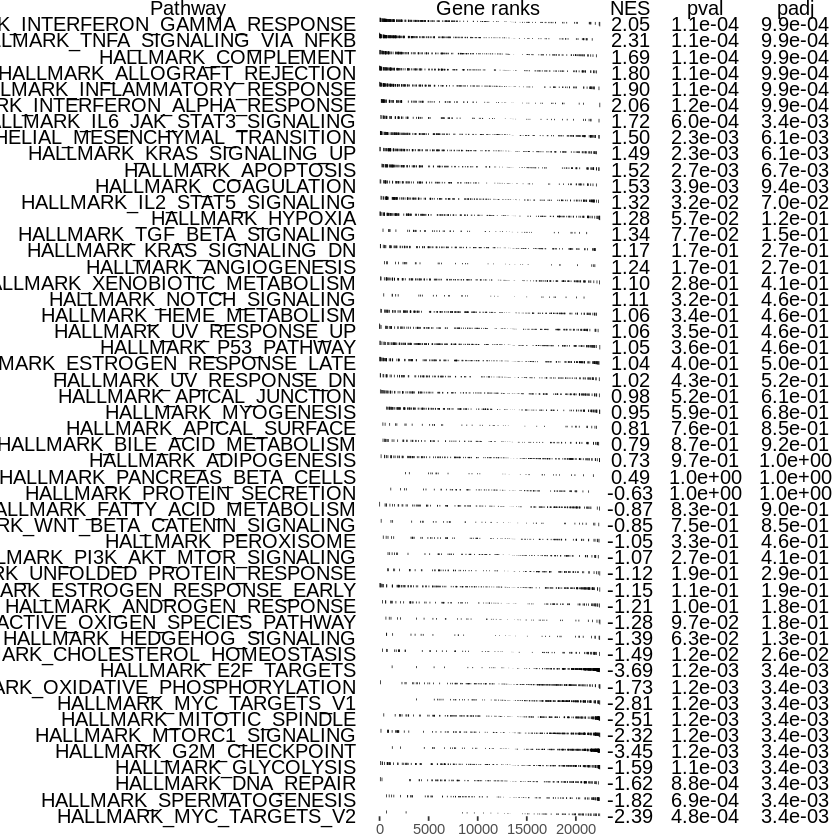

In [57]:
topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)




# topPathwaysUp <- fgseaRes[ES > 0]
# topPathwaysDown <- fgseaRes[ES < 0]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))


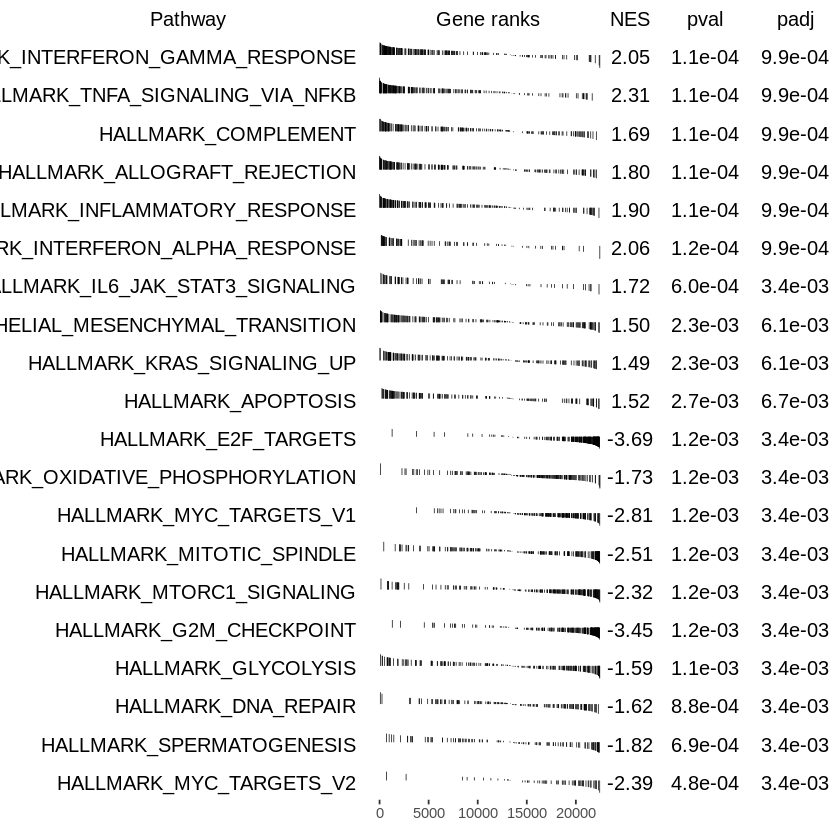

In [58]:
topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)


In [59]:
library(topGO)

Loading required package: graph

Attaching package: 'graph'

The following object is masked from 'package:stringr':

    boundary

The following object is masked from 'package:Biostrings':

    complement

Loading required package: GO.db
Loading required package: AnnotationDbi

Attaching package: 'AnnotationDbi'

The following object is masked from 'package:dplyr':

    select

Loading required package: SparseM

Attaching package: 'SparseM'

The following object is masked from 'package:base':

    backsolve


groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Attaching package: 'topGO'

The following object is masked from 'package:IRanges':

    members



In [60]:
data(geneList)
head(geneList)



1095_s_at   1130_at   1196_at 1329_s_at 1340_s_at 1342_g_at 
1.0000000 1.0000000 0.6223795 0.5412240 1.0000000 1.0000000

In [61]:
# gene <- names(geneList)[abs(geneList) > 2]
#sum(gene)

In [62]:
# print(geneList)

In [63]:
library(org.Hs.eg.db)

In [64]:
library(clusterProfiler)

clusterProfiler v3.10.1  For help: https://guangchuangyu.github.io/software/clusterProfiler

If you use clusterProfiler in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Yanyan Han, Qing-Yu He. clusterProfiler: an R package for comparing biological themes among gene clusters. OMICS: A Journal of Integrative Biology. 2012, 16(5):284-287.

Attaching package: 'clusterProfiler'

The following object is masked from 'package:DelayedArray':

    simplify



In [65]:
head(gene_ranks)

RPL17        DYX1C1          FOSB          PIGY RP11-513I15.6 
    -1.599601     -1.350720      1.360915     -1.229030     -1.227788 
        CORO7 
    -1.222245

In [66]:
head(top)

,logFC,logCPM,LR,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000215472,-1.599601,5.388916,787.5075,2.806625e-173,6.303399e-169
ENSG00000256061,-1.350720,5.467159,554.8173,1.127304e-122,1.265907e-118
ENSG00000125740,1.360915,6.620002,516.3322,2.657790e-114,1.989710e-110
ENSG00000145337,-1.229030,5.345795,395.0875,6.461566e-88,3.628008e-84
ENSG00000225339,-1.227788,5.337219,391.0504,4.888731e-87,2.195920e-83
ENSG00000103426,-1.222245,5.336532,386.5457,4.676254e-86,1.750400e-82


In [67]:
top_bool = top$PValue < 0.05
head(top_bool)
tail(top_bool)

[1] TRUE TRUE TRUE TRUE TRUE TRUE

[1] FALSE FALSE FALSE FALSE FALSE FALSE

In [68]:
top_pcut = top[top_bool,]
length(top[,1])
length(top_pcut[,1])

[1] 22459

[1] 8949

In [69]:
head(top_pcut)

,logFC,logCPM,LR,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000215472,-1.599601,5.388916,787.5075,2.806625e-173,6.303399e-169
ENSG00000256061,-1.350720,5.467159,554.8173,1.127304e-122,1.265907e-118
ENSG00000125740,1.360915,6.620002,516.3322,2.657790e-114,1.989710e-110
ENSG00000145337,-1.229030,5.345795,395.0875,6.461566e-88,3.628008e-84
ENSG00000225339,-1.227788,5.337219,391.0504,4.888731e-87,2.195920e-83
ENSG00000103426,-1.222245,5.336532,386.5457,4.676254e-86,1.750400e-82


In [70]:
head(gene_info)

,gene_names
,<fct>
ENSG00000000003,TSPAN6
ENSG00000000005,TNMD
ENSG00000000419,DPM1
ENSG00000000457,SCYL3
ENSG00000000460,C1orf112
ENSG00000000938,FGR


In [71]:
gr_symb2 = gene_info[rownames(top_pcut),]
head(gr_symb2)

[1] RPL17         DYX1C1        FOSB          PIGY          RP11-513I15.6
[6] CORO7        
47040 Levels: 5_8S_rRNA 5S_rRNA 7SK A1BG A1CF A2LD1 A2M A2ML1 ... ZZZ3

In [72]:
gr_symb3 = gene_info[rownames(top),]
length(gr_symb2)
length(gr_symb3)

[1] 8949

[1] 22459

In [73]:
top_pcut_upbool = top_pcut$logFC > 0
top_pcut_dobool = !top_pcut_upbool
top_pcut_up = top_pcut[top_pcut_upbool,]
top_pcut_do = top_pcut[top_pcut_dobool,]
length(top_pcut_up[,1])
length(top_pcut_do[,1])

[1] 5857

[1] 3092

In [74]:
gr_symb_up = gene_info[rownames(top_pcut_up),]
gr_symb_do = gene_info[rownames(top_pcut_do),]


In [75]:
ego <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "ALL",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)
head(summary(ego))

ego2 <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "ALL",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

Warning message in summary(ego):
"summary method to convert the object to data.frame is deprecated, please use as.data.frame instead."

,ONTOLOGY,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0002250,BP,GO:0002250,adaptive immune response,260/3223,469/13806,1.537596e-52,8.868852e-49,7.508322e-49,IGHG3/IGKV4-1/IGKV1-5/IGHG1/SLAMF1/IGHV1-69/IGHV3-23/IGKV3-20/CD1D/IGLV3-1/IGHG2/FCGR2B/IGHV5-51/IGHG4/IGHV3-30/IGHM/IGHV3-33/IGHV3-11/IGHV4-59/IGLV3-19/IGHV3-15/IGHV1-18/IGKV1-9/IGHV3-7/CD79A/BTLA/IGHA1/IGKV1-12/IGHV3-48/C1QB/IGLV1-44/IGKV1-6/IGLV3-21/IGLV3-25/IGLC2/IGHV3-21/IGHV3-74/C1QC/C1QA/UNC13D/IGLV1-40/IGLV1-47/IGHV1-24/CD40/IGHV4-39/IGLV6-57/IGHV3-9/IGKV1-16/LAMP3/IGKV1-17/IGHV2-5/SLAMF6/IGHV3-49/IGHV3-53/IGKV2-30/SASH3/TNFRSF13B/CD74/IGKV2-24/IGKV3-15/IGLV4-69/IGHV2-70/IGLV8-61/IGHV4-31/KDM5D/IGHV6-1/IGHV4-34/IGHV4-4/SIT1/NFKBIZ/BTK/LILRB1/IGKV1D-33/IGLV2-8/IGHA2/IGLV2-14/IGLV3-10/IGHV4-61/CD27/SAMSN1/IGLV2-23/IGHV3-72/IGLV7-46/CD84/IGHV2-26/IGHV3-73/POU2F2/IGKV1-8/IGLC3/HLA-H/CCR2/ZC3H12A/IGHV1-8/IGKV3D-15/IGHV1-3/IGKV1D-39/IGLV7-43/IGKV1D-13/IGHV3-43/IGKV2D-29/FCER2/IGLV3-27/IGKV1D-12/CEACAM1/IGKV1-27/HLA-F/CTSS/IGKV3D-20/ALCAM/IGLV2-11/IGHV3-20/IGHV3-13/IGKV5-2/IGKV1-39/IGLV1-36/RSAD2/IGLV3-9/IGLV5-45/IGKV6-21/LILRB2/PTPN6/C4B/LILRB5/CLC/TNFRSF13C/SLAMF7/IRF7/RIPK3/SERPING1/IGHV3-66/MYO1G/IGLV9-49/CD274/IGHV3-64/TNFAIP3/IGLV10-54/IGLC7/ARG1/BTN3A3/IGKV3D-11/LY9/IGLV4-60/UNC93B1/KLHL6/HLA-C/CD79B/FCER1G/ANXA1/IGKV2D-28/PRKCB/CD4/IGKV2-28/IGHV1-58/IGKV1D-8/IRF1/CR1/TBX21/CD244/HLA-B/PAG1/IGLV1-51/C4A/IGKV6D-21/CD86/PRKCD/SLC11A1/TRAT1/TRPM4/TNF/TNFSF13B/HLA-E/IL1B/B2M/IGLV5-37/NFKBID/IGLV3-16/IL12A/MARCH8/LAX1/IGLV2-18/PTK2B/BTN3A1/IGKV2D-30/ERAP2/IGLJ1/IGKV2-29/TNFSF13/IL18/PRKD2/JAK2/NLRP3/TXK/PRKCZ/GPR183/EIF2AK4/DUSP10/CD55/IL18RAP/CLEC4A/IGHE/IGHD1-1/SEMA4A/HLA-A/IGKV1D-17/IGHV4-28/LILRA1/C8G/IGKV1-13/SYK/LTA/LILRA3/C2/IL23A/IGHV1-45/IGHD/IL18R1/IL7R/GAPT/LILRA6/C1R/HAVCR2/C7/IGLL5/HLX/CLEC4D/CD209/HPX/PRR7/CLCF1/MASP2/BTN3A2/CD48/HFE/C1S/SPN/IL18BP/TAP1/IGLV4-3/LAT2/TLR4/IL1R1/CD46/PRDM1/SKAP1/AGER/ERCC1/TNFRSF17/DUSP22/TGFB1/IL6/LILRB3/TLR8/TEC/MEF2C/IL12RB1/PIK3CG/TSC1/ZAP70/EBI3/GCNT3,260
GO:0006959,BP,GO:0006959,humoral immune response,173/3223,267/13806,5.644300e-48,1.627816e-44,1.378100e-44,IGHG3/IGKV4-1/IGKV1-5/IGHG1/IGHV1-69/IGHV3-23/IGKV3-20/IGLV3-1/IGHG2/FCGR2B/IGHV5-51/IGHG4/IGHV3-30/IGHM/IGHV3-33/IGHV3-11/IGHV4-59/IGLV3-19/IGHV3-15/IGHV1-18/IGHV3-7/S100A9/IGHA1/IGKV1-12/IGHV3-48/C1QB/IGLV1-44/IGLV3-21/S100A8/IGLV3-25/IGLC2/IGHV3-21/IGHV3-74/C1QC/C1QA/IGLV1-40/IGLV1-47/IGHV1-24/IGHV4-39/IGLV6-57/IGHV3-9/IGKV1-16/IGKV1-17/IGHV2-5/IGHV3-49/IGHV3-53/IGKV2-30/IGKV3-15/IGHV2-70/A2M/IGHV4-31/IGHV6-1/IGHV4-34/IGHV4-4/LYZ/IGKV1D-33/IGLV2-8/IGHA2/IGLV2-14/IGHV4-61/IGLV2-23/LY86/HIST1H2BG/IGHV3-72/FCN1/IGHV2-26/IGHV3-73/POU2F2/IGLC3/CCR2/IGHV1-8/BLNK/IGHV1-3/IGKV1D-39/IGLV7-43/IGHV3-43/FCER2/IGLV3-27/IGKV1D-12/S100A12/IGKV3D-20/IGLV2-11/IGHV3-20/VSIG4/IGHV3-13/MS4A1/IGKV5-2/IGKV1-39/RNASE6/PTPN6/C4B/HIST1H2BC/CD19/HIST2H2BE/LTF/SERPING1/IGHV3-66/IGHV3-64/LCN2/IGLC7/CFP/IGKV3D-11/RNASE3/ST6GAL1/IGKV2D-28/IGKV2-28/IGHV1-58/CR1/DEFA3/AZU1/IGLV1-51/C4A/CAMP/TREM1/SLC11A1/TNF/ELANE/PPBP/HLA-E/CXCL2/PAX5/HIST1H2BF/IGKV2D-30/IGKV2-29/CD83/PGLYRP1/DEFA4/CXCL3/GPR183/CD55/IGHE/IGHV4-28/CTSG/PF4/CXCL9/HIST1H2BJ/PDCD1/C8G/LTA/CXCL1/POU2AF1/C2/BPI/IGHV1-45/IGHD/PRTN3/VTN/C1R/NOTCH1/SPON2/C7/IGLL5/RPS19/C5AR1/HPX/MASP2/HIST1H2BK/IL7/HIST1H2BE/C1S/BCL2/CD46/BST1/SFTPD/CD59/GNLY/IL6/SPINK5/HIST1H2BI/MEF2C/CXCL10/EBI3/PGLYRP2,173
GO:0006958,BP,GO:0006958,"complement activation, classical pathway",100/3223,119/13806,7.618781e-45,1.464838e-41,1.240124e-41,IGHG3/IGKV4-1/IGKV1-5/IGHG1/IGHV1-69/IGHV3-23/IGKV3-20/IGLV3-1/IGHG2/IGHV5-51/IGHG4/IGHV3-30/IGHM/IGHV3-33/IGHV3-11/IGHV4-59/IGLV3-19/IGHV3-15/IGHV1-18/IGHV3-7/IGHA1/IGKV1-12/IGHV3-48/C1QB/IGLV1-44/IGLV3-21/IGLV3-25/IGLC2/IGHV3-21/IGHV3-74/C1QC/C1QA/IGLV1-40/IGLV1-47/IGHV1-24/IGHV4-39/IGLV6-57/IGHV3-9/IGKV1-16/IGKV1-17/IGHV2-5/IGHV3-49/IGHV3-53/IGKV2-30/IGKV3-15/IGHV2-70/IGHV4-31/IGHV6-1/IGHV4-34/IGHV4-4/IGKV1D-33/IGLV2-8/IGHA2/IGLV

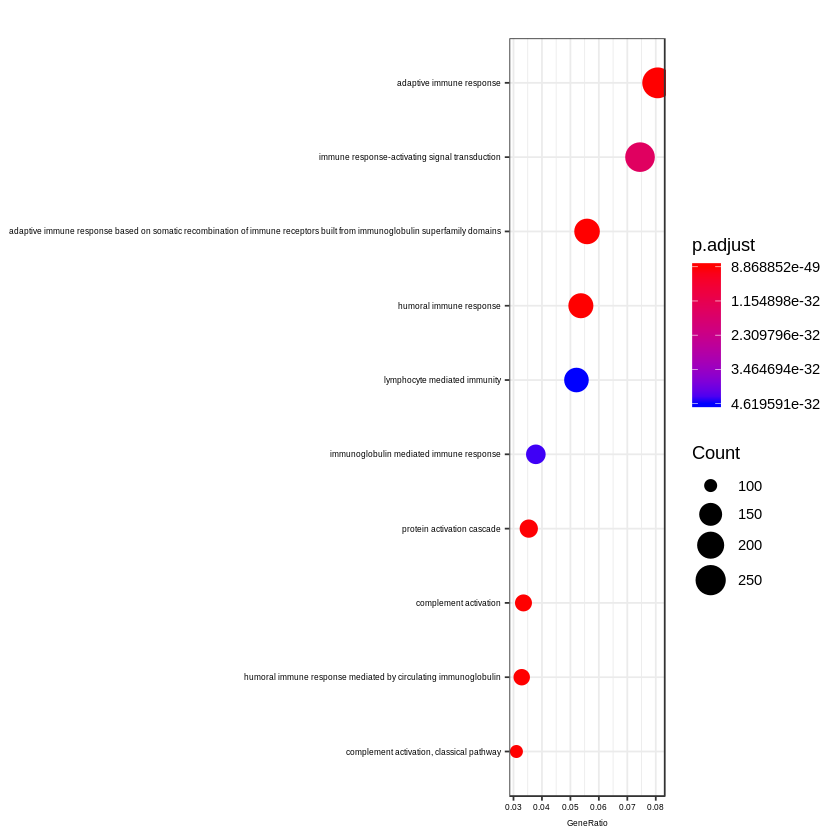

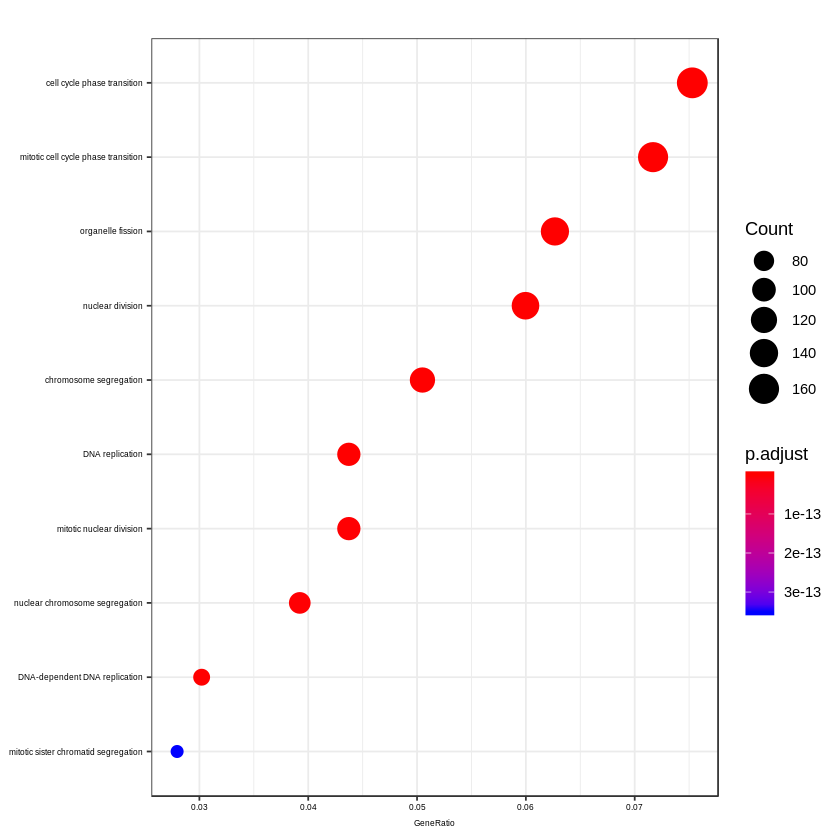

In [76]:
dotplot(ego, showCategory=10, font.size = 5)
dotplot(ego2, showCategory=10, font.size = 5)

In [77]:
ego_BP <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "BP",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)
# head(summary(ego))

ego_MF <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "MF",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

ego_CC <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "CC",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)


ego2_BP <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "BP",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

ego2_MF <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "MF",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

ego2_CC <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "CC",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)


groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Building most specific GOs .....
	( 11060 GO terms found. )

Build GO DAG topology ..........
	( 11060 GO terms and 26049 relations. )

Annotating nodes ...............
	( 13806 genes annotated to the GO terms. )
Loading required package: Rgraphviz
Loading required package: grid

Attaching package: 'grid'

The following object is masked from 'package:topGO':

    depth


Attaching package: 'Rgraphviz'

The following object is masked from 'package:ShortRead':

    name

The following objects are masked from 'package:IRanges':

    from, to

The following objects are masked from 'package:S4Vectors':

    from, to



$dag
A graphNEL graph with directed edges
Number of Nodes = 41 
Number of Edges = 73 

$complete.dag
[1] "A graph with 41 nodes."



groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Building most specific GOs .....
	( 2450 GO terms found. )

Build GO DAG topology ..........
	( 2450 GO terms and 3205 relations. )

Annotating nodes ...............
	( 13800 genes annotated to the GO terms. )


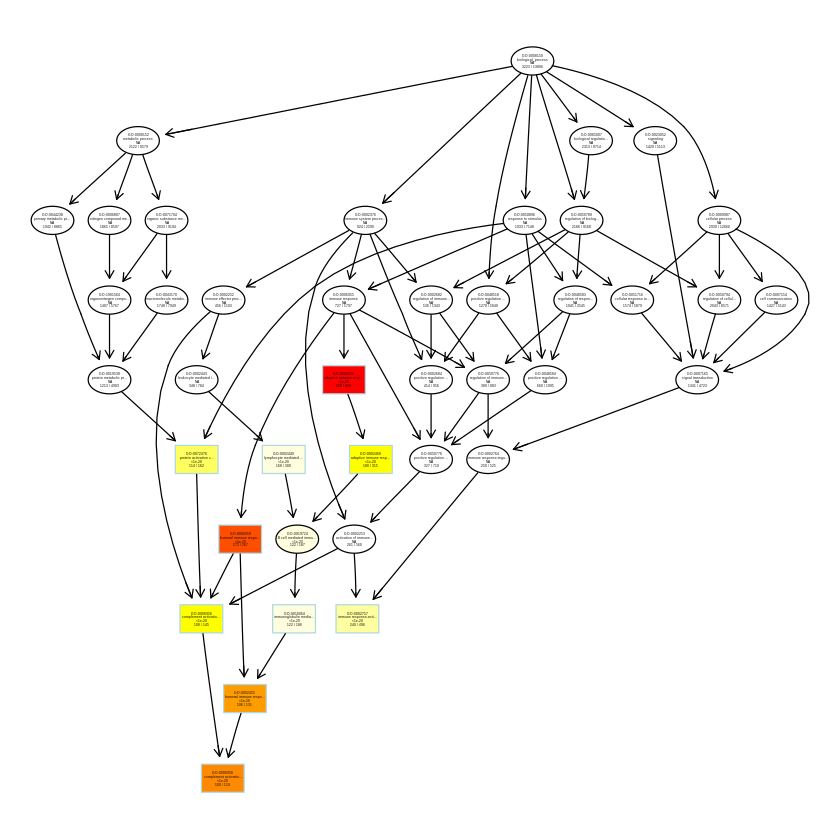

$dag
A graphNEL graph with directed edges
Number of Nodes = 21 
Number of Edges = 24 

$complete.dag
[1] "A graph with 21 nodes."



groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Building most specific GOs .....
	( 1279 GO terms found. )

Build GO DAG topology ..........
	( 1279 GO terms and 2383 relations. )

Annotating nodes ...............
	( 14428 genes annotated to the GO terms. )


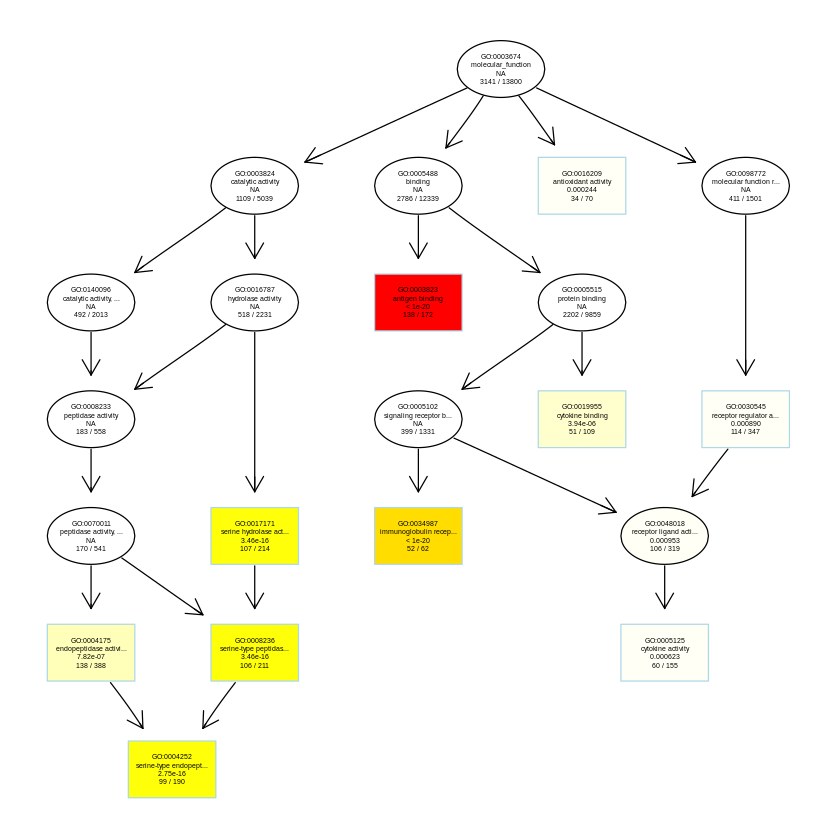

$dag
A graphNEL graph with directed edges
Number of Nodes = 42 
Number of Edges = 71 

$complete.dag
[1] "A graph with 42 nodes."



groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Building most specific GOs .....
	( 9542 GO terms found. )

Build GO DAG topology ..........
	( 9542 GO terms and 21968 relations. )

Annotating nodes ...............
	( 13806 genes annotated to the GO terms. )


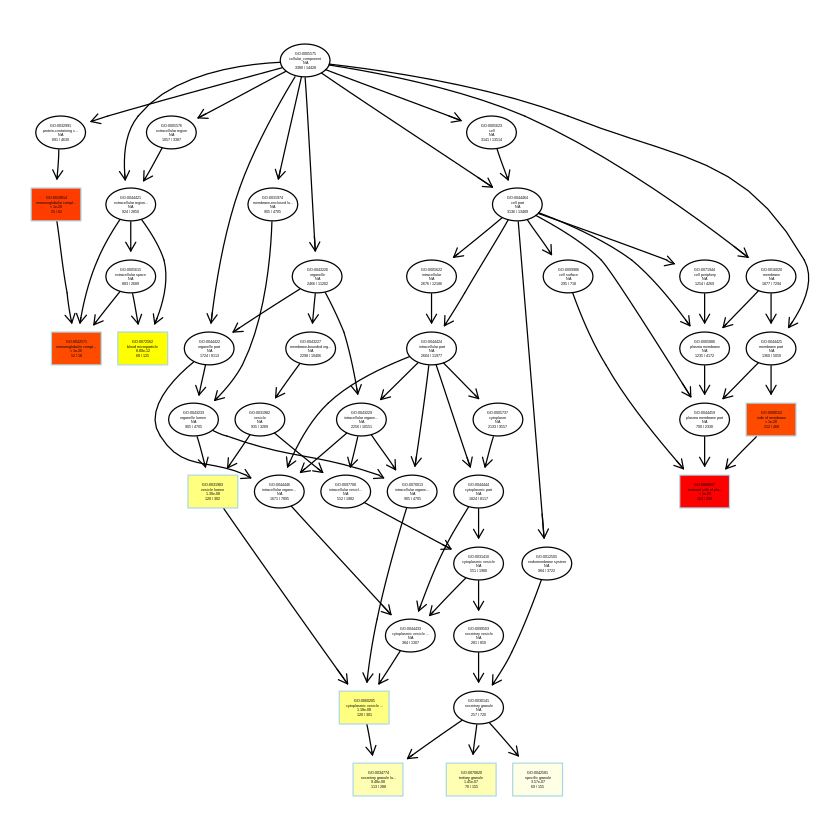

$dag
A graphNEL graph with directed edges
Number of Nodes = 40 
Number of Edges = 63 

$complete.dag
[1] "A graph with 40 nodes."



groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Building most specific GOs .....
	( 2139 GO terms found. )

Build GO DAG topology ..........
	( 2139 GO terms and 2786 relations. )

Annotating nodes ...............
	( 13800 genes annotated to the GO terms. )


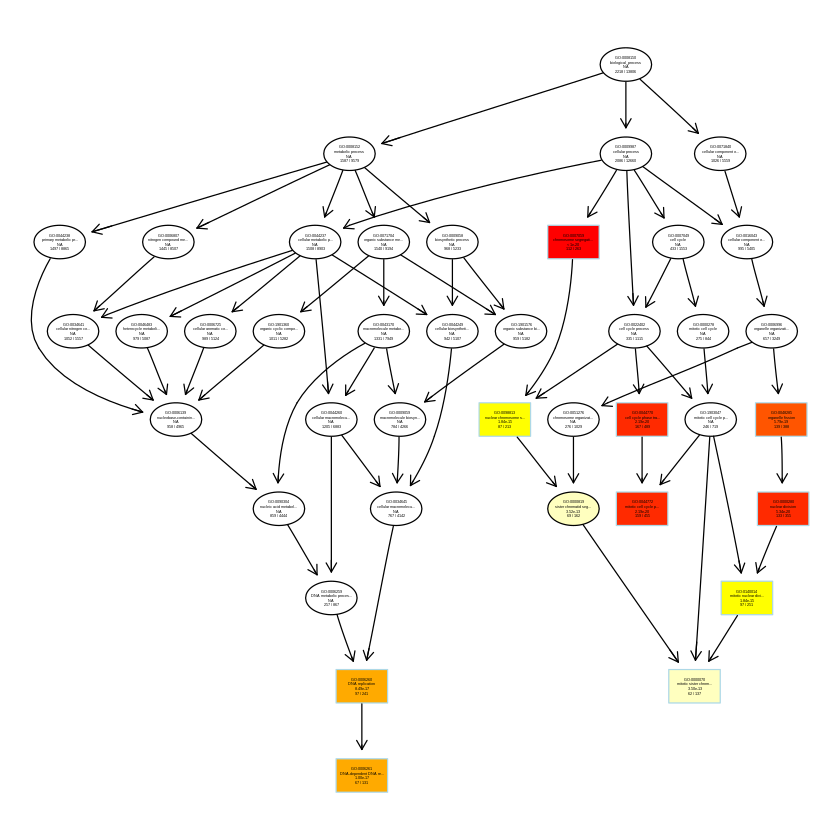

$dag
A graphNEL graph with directed edges
Number of Nodes = 24 
Number of Edges = 24 

$complete.dag
[1] "A graph with 24 nodes."



groupGOTerms: 	GOBPTerm, GOMFTerm, GOCCTerm environments built.

Building most specific GOs .....
	( 1251 GO terms found. )

Build GO DAG topology ..........
	( 1251 GO terms and 2375 relations. )

Annotating nodes ...............
	( 14428 genes annotated to the GO terms. )


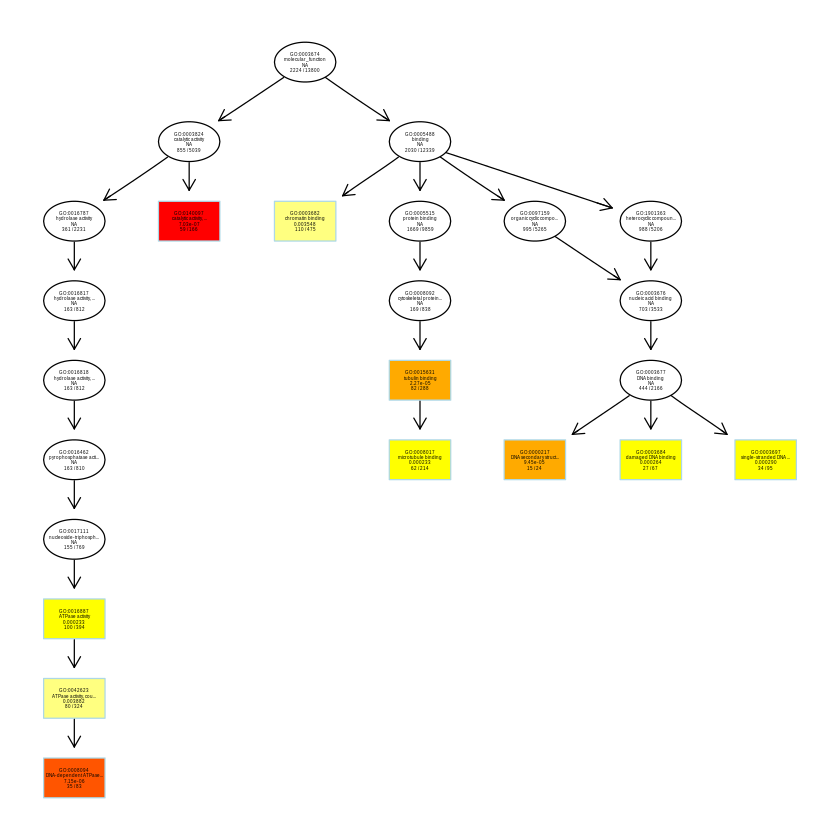

$dag
A graphNEL graph with directed edges
Number of Nodes = 37 
Number of Edges = 62 

$complete.dag
[1] "A graph with 37 nodes."


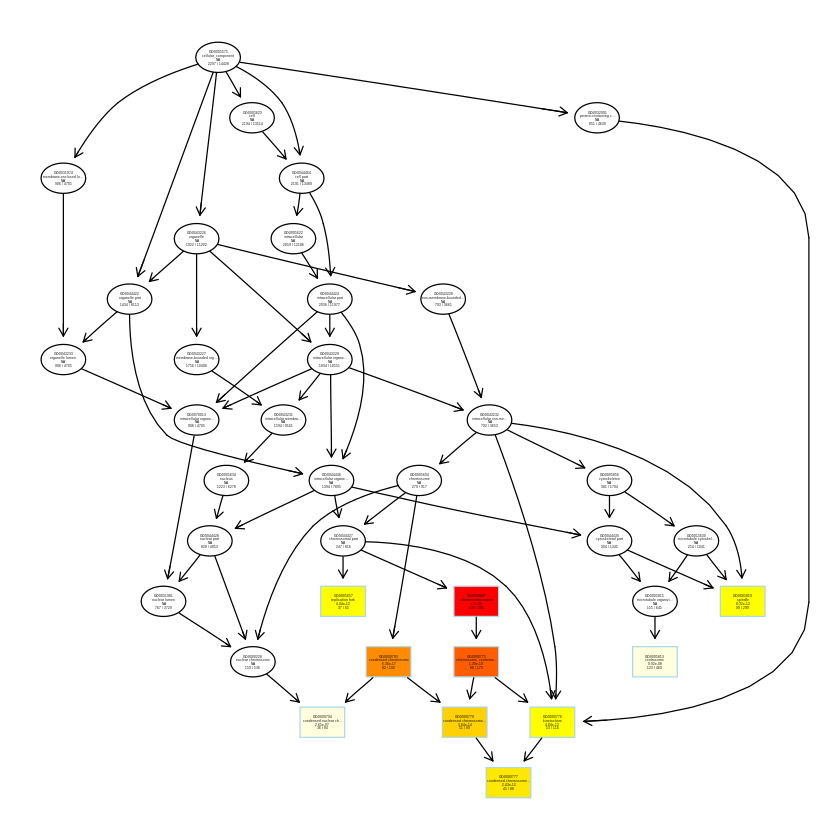

In [78]:
plotGOgraph(ego_BP)
plotGOgraph(ego_MF)
plotGOgraph(ego_CC)


plotGOgraph(ego2_BP)

plotGOgraph(ego2_MF)
plotGOgraph(ego2_CC)